In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt # for plot
import numpy as np

## Q1 Data Loading

### Q1-1

In [25]:
#Load the plays.csv data using DataFrame from pandas library.
df = pd.read_csv('plays.csv')


,gameId,playId,playDescription,quarter,down,yardsToGo,possessionTeam,specialTeamsPlayType,specialTeamsResult,kickerId,...,penaltyCodes,penaltyJerseyNumbers,penaltyYards,preSnapHomeScore,preSnapVisitorScore,passResult,kickLength,kickReturnYardage,playResult,absoluteYardlineNumber
0,2018091700,35,C.Parkey kicks 65 yards from CHI 35 to end zon...,1,0,0,CHI,Kickoff,Touchback,41688.0,...,NaN,NaN,NaN,0,0,NaN,75.0,NaN,40,75
1,2018102102,35,C.Parkey kicks 65 yards from CHI 35 to end zon...,1,0,0,CHI,Kickoff,Touchback,41688.0,...,NaN,NaN,NaN,0,0,NaN,70.0,NaN,40,75
2,2018120205,35,R.Sanchez kicks 65 yards from IND 35 to end zo...,1,0,0,IND,Kickoff,Touchback,45153.0,...,NaN,NaN,NaN,0,0,NaN,73.0,NaN,40,75
3,2018121603,35,M.Crosby kicks 73 yards from GB 35 to CHI -8. ...,1,0,0,GB,Kickoff,Return,32386.0,...,NaN,NaN,NaN,0,0,NaN,73.0,31.0,42,75
4,2019090500,35,E.Pineiro kicks 65 yards from CHI 35 to end zo...,1,0,0,CHI,Kickoff,Touchback,46426.0,...,NaN,NaN,NaN,0,0,NaN,74.0,NaN,40,75


### Q1-2-1

In [ ]:
# Find the preprocessed dataset.
df = pd.read_csv('plays_processed.csv')

#### Q1-2-2

In [ ]:
#Find out another preprocessing step by yourself with your reasons

Preprocessing step:
There are many rows with missing values in either the kicker or the returner cell. This means that for example if the 
returner cell is NA (missing) for a particular player(kicker), that player will be mapped to NA node in the graph thus 
increasingthe number of empty nodes during analysis. When someone queries the number of nodes for example, these nodes are 
    counted as part of the overal nodes thus, misleading the user.
ACTION TAKEN
    I deleted the rows with missing value.


## Q2 Graph Construction and Visualization

### Q2-1

In [ ]:

I would use Directed graphs  

Reason:
    In directed graphs, the vertices are connected together in such a way that all edges are directed from one 
    vertex to another. This is true for the kicker and returner where the kicker kicks the ball towards the
    returner's direction and the returner has the role of running with the ball and not necessarily going towards the
    kickers direction. In addition, the directed graphs makes it easy to analyse social relationship among the players.
     



### Q2-2-1

Name: 
Type: Graph
Number of nodes: 140
Number of edges: 99
Average degree:   1.4143


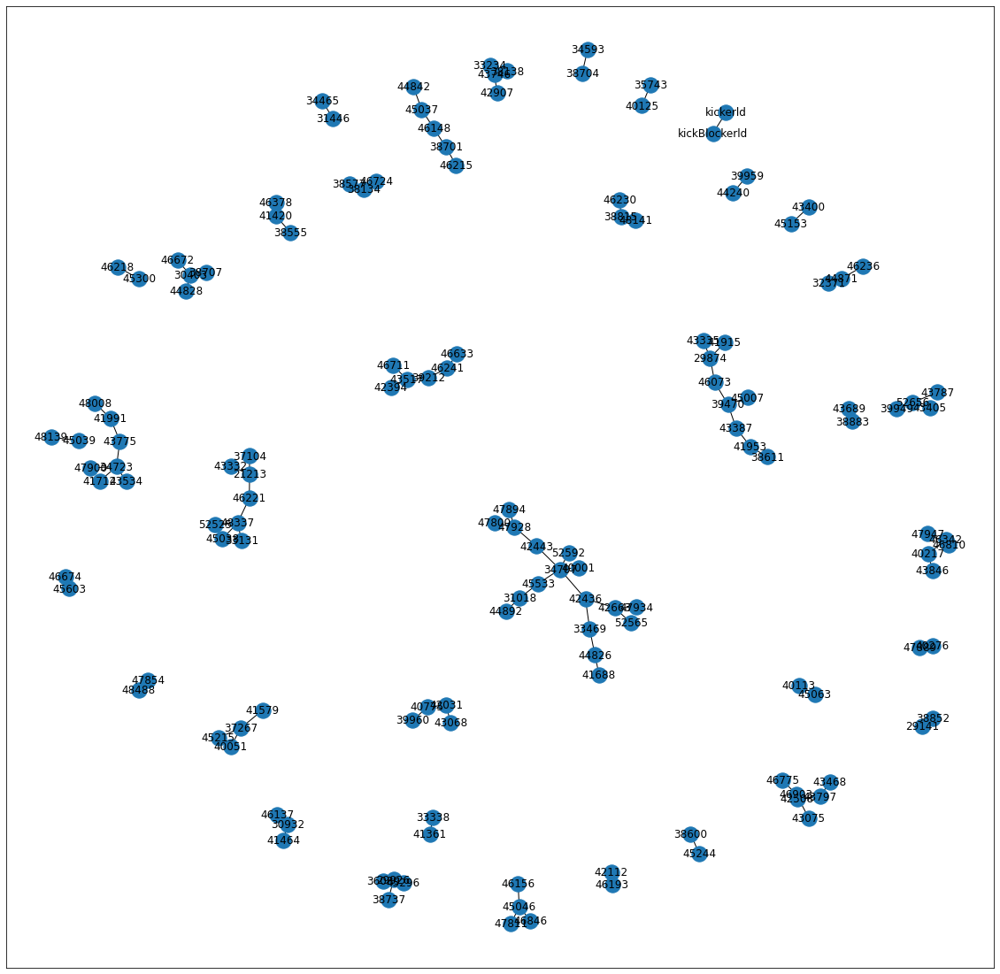

In [44]:
pl_df = pd.read_csv('kicker_blocker.txt', names=['kickerld', 'kickBlockerld'], sep='\t')


# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kickerld',target='kickBlockerld')


#set the size
plt.figure(figsize=(20,20))


# draw figure with customized options
nx.draw_networkx(pl_graph)

plt.show()


### Q2-2-2

Name: 
Type: Graph
Number of nodes: 480
Number of edges: 2562
Average degree:  10.6750


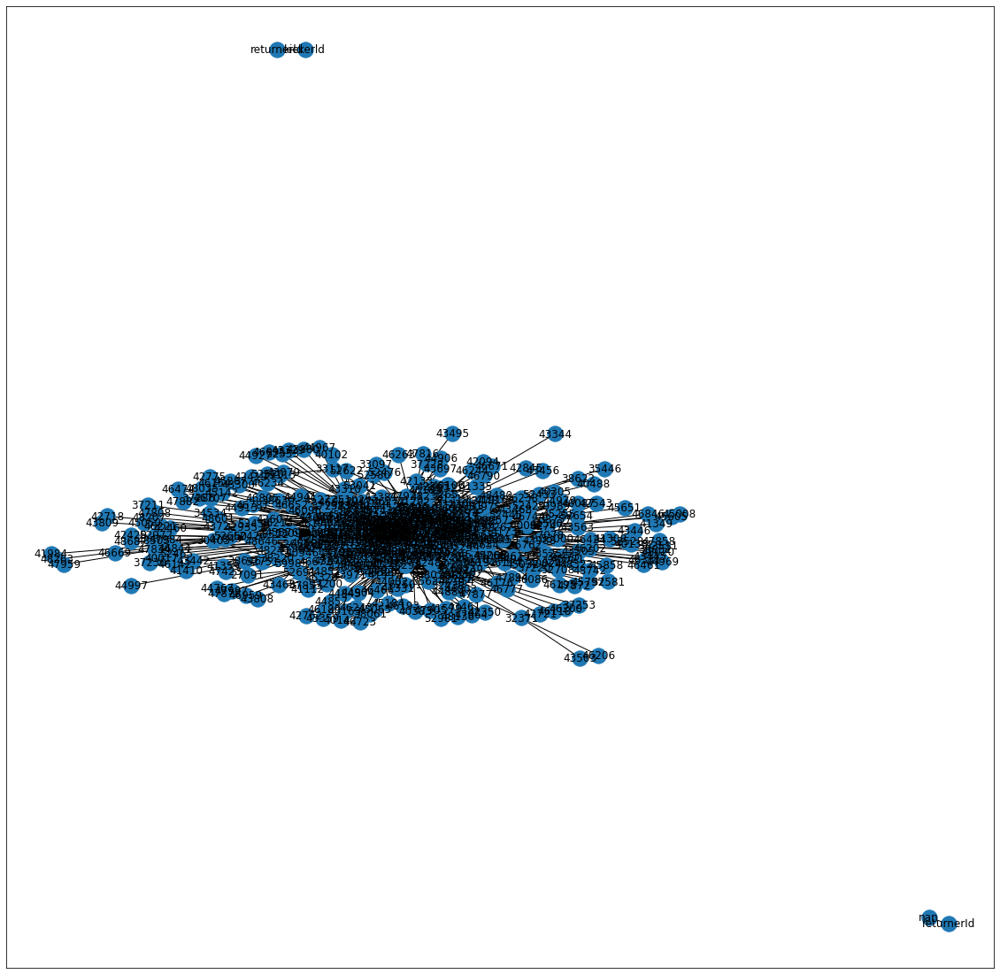

In [91]:
pl_df = pd.read_csv('kicker_returner.txt', names=['kickerld', 'returnerld'], sep='\t')

pl_df.head()
# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kickerld',target='returnerld')


print(nx.info(pl_graph))

plt.figure(figsize=(20,20))
nx.draw_networkx(pl_graph)
plt.show()

### Q2-3-1

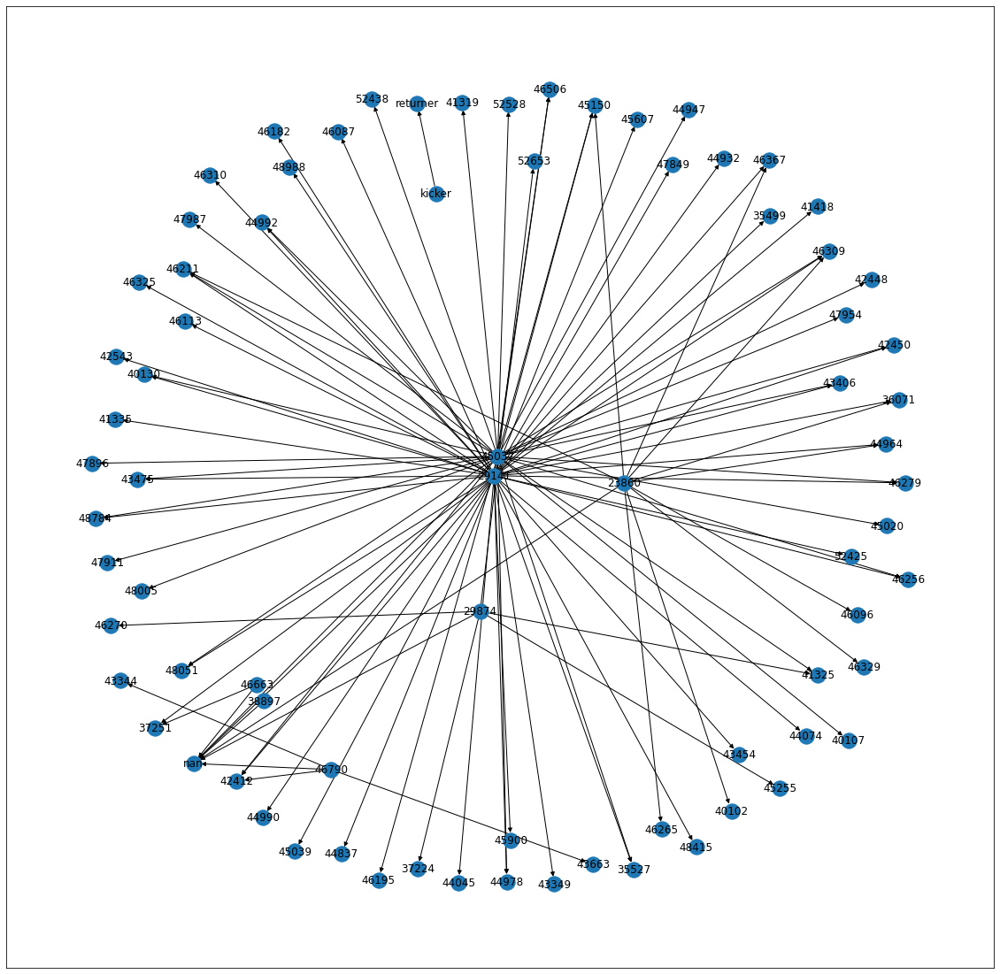

In [113]:
pl_df = pd.read_csv('ARI.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

80


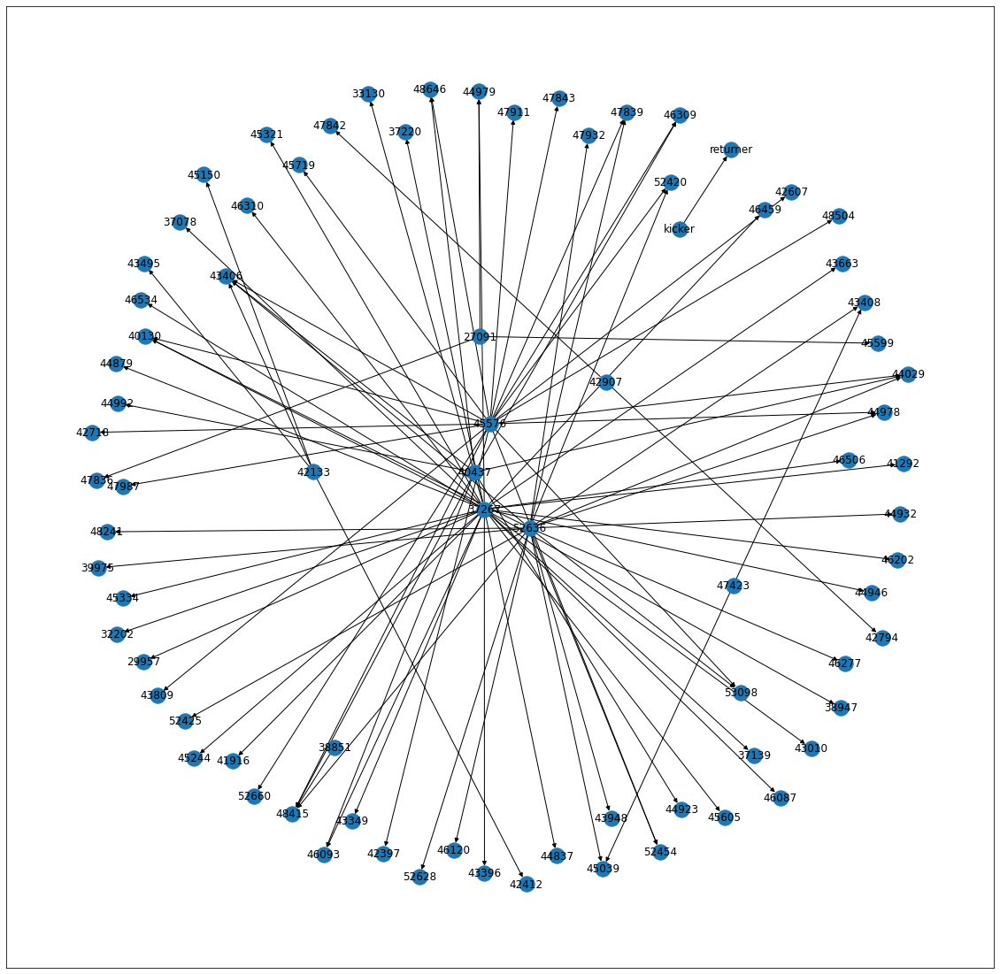

In [71]:
pl_df = pd.read_csv('ATL.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())


        

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )
print(nx.number_of_nodes(pl_graph))

plt.show()

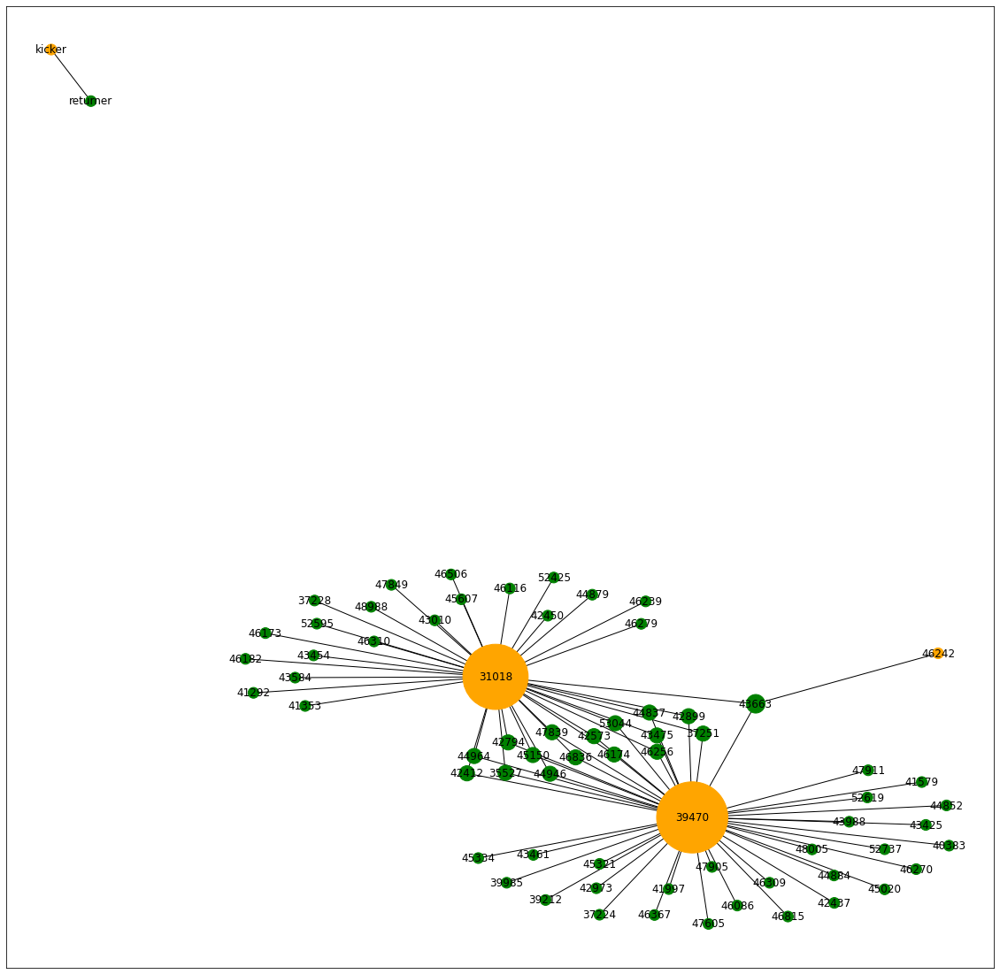

In [27]:
pl_df = pd.read_csv('BAL.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner')
# set layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

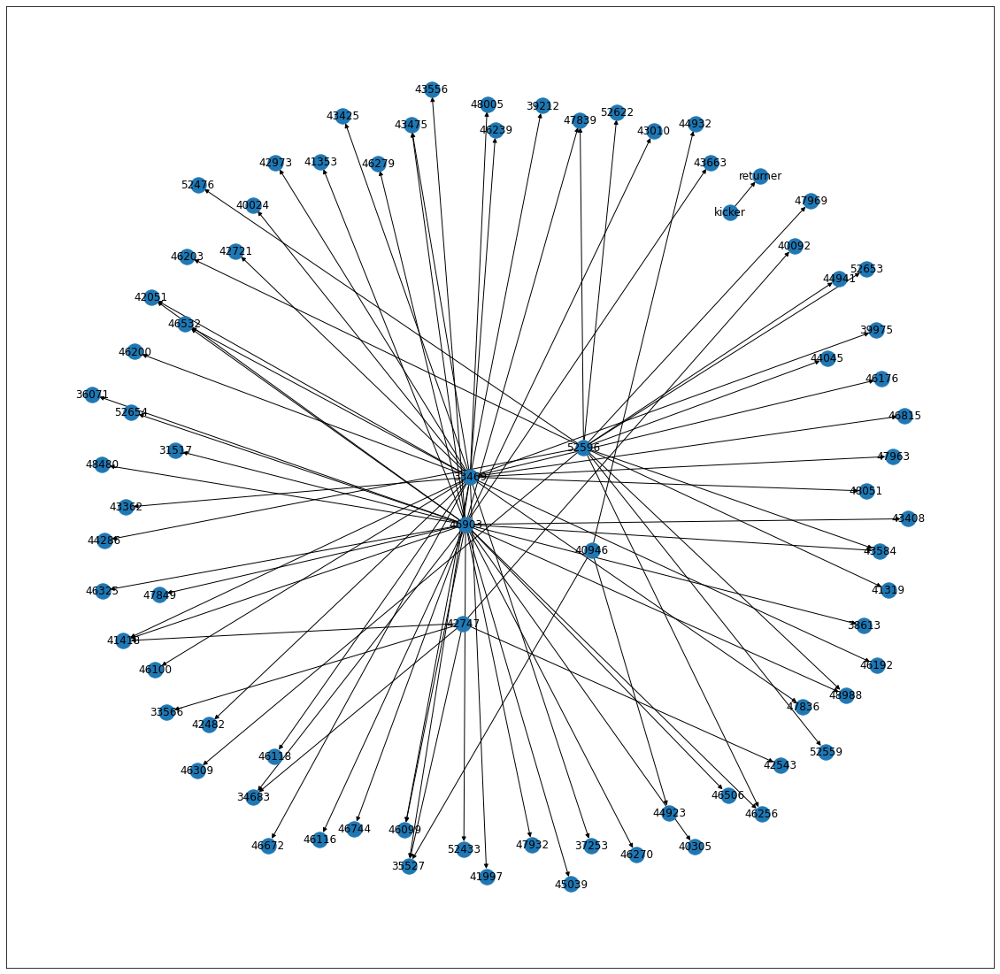

In [25]:
pl_df = pd.read_csv('BUF.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

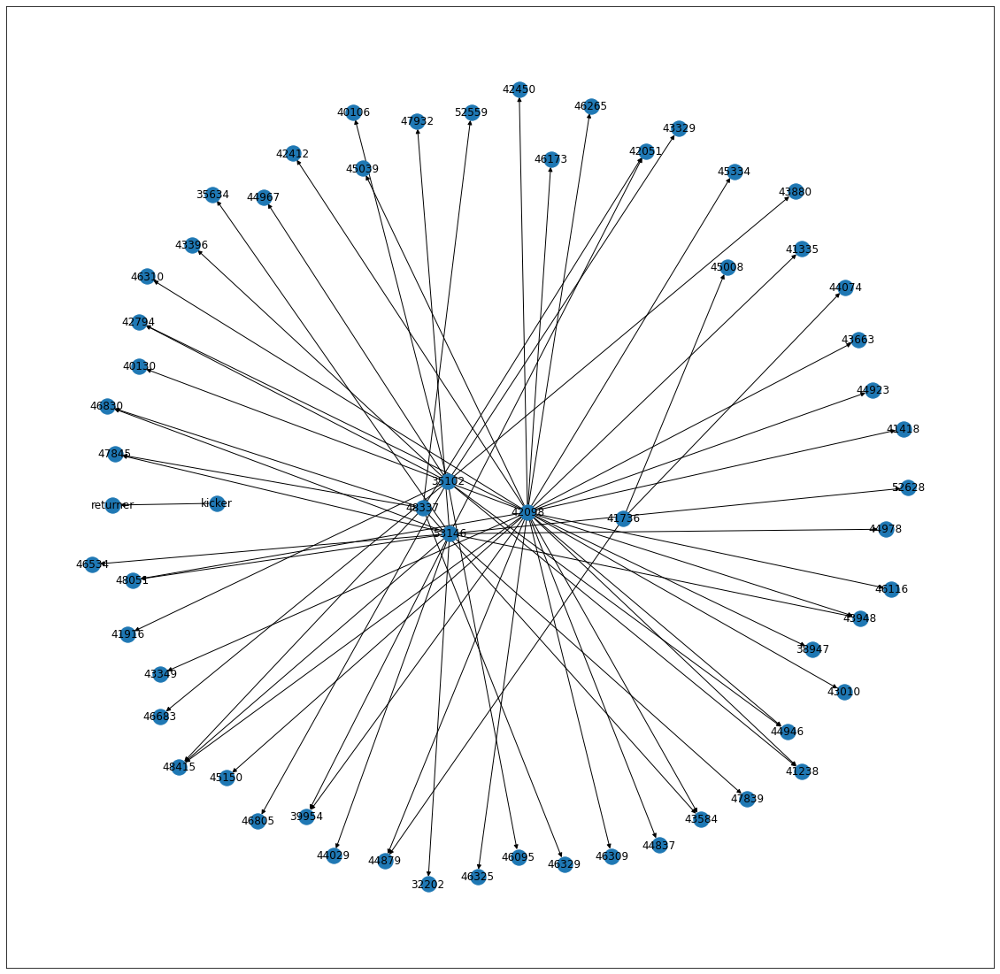

In [26]:
pl_df = pd.read_csv('CAR.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

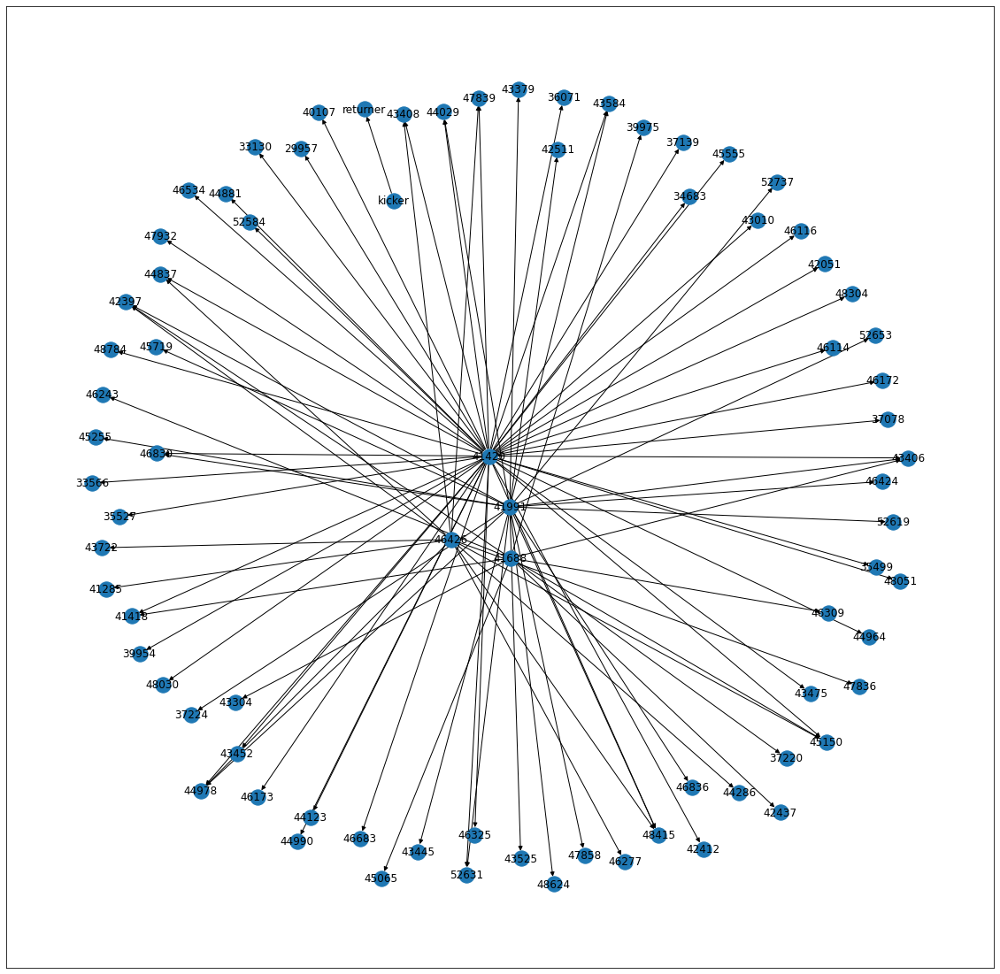

In [27]:
pl_df = pd.read_csv('CHI.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

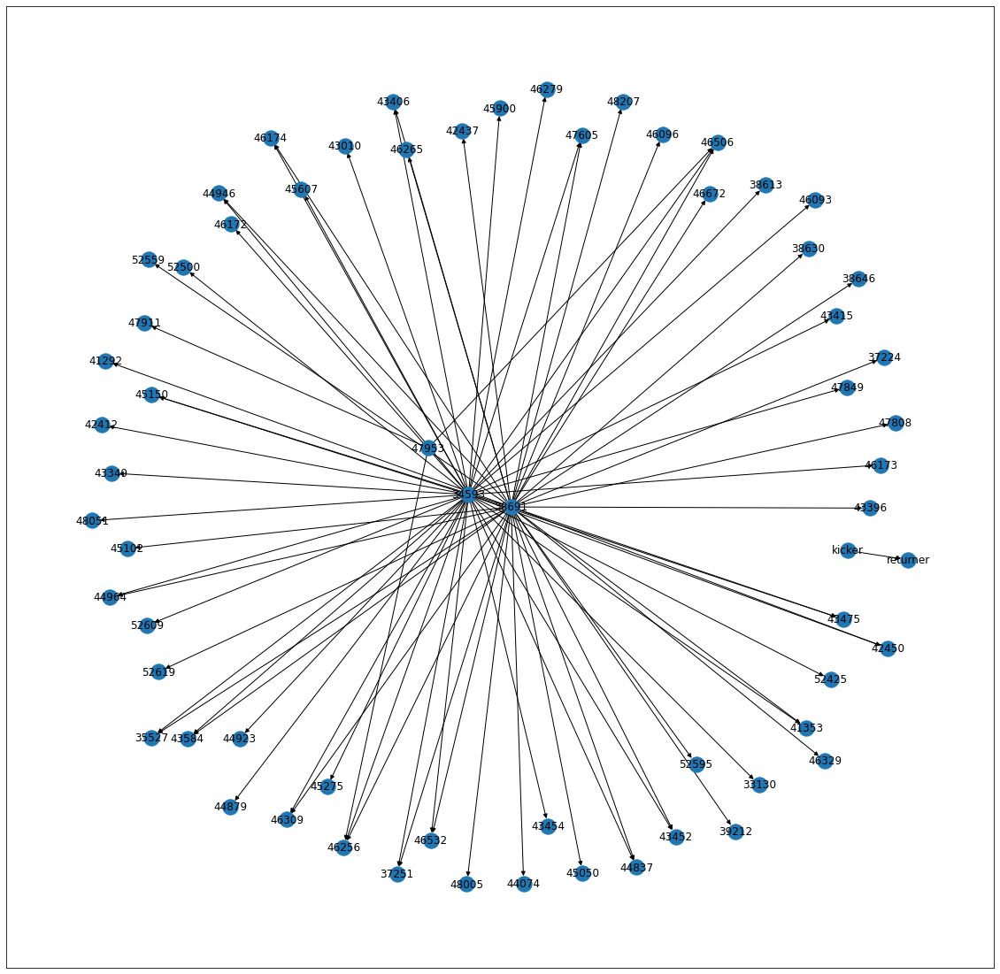

In [28]:
pl_df = pd.read_csv('CIN.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

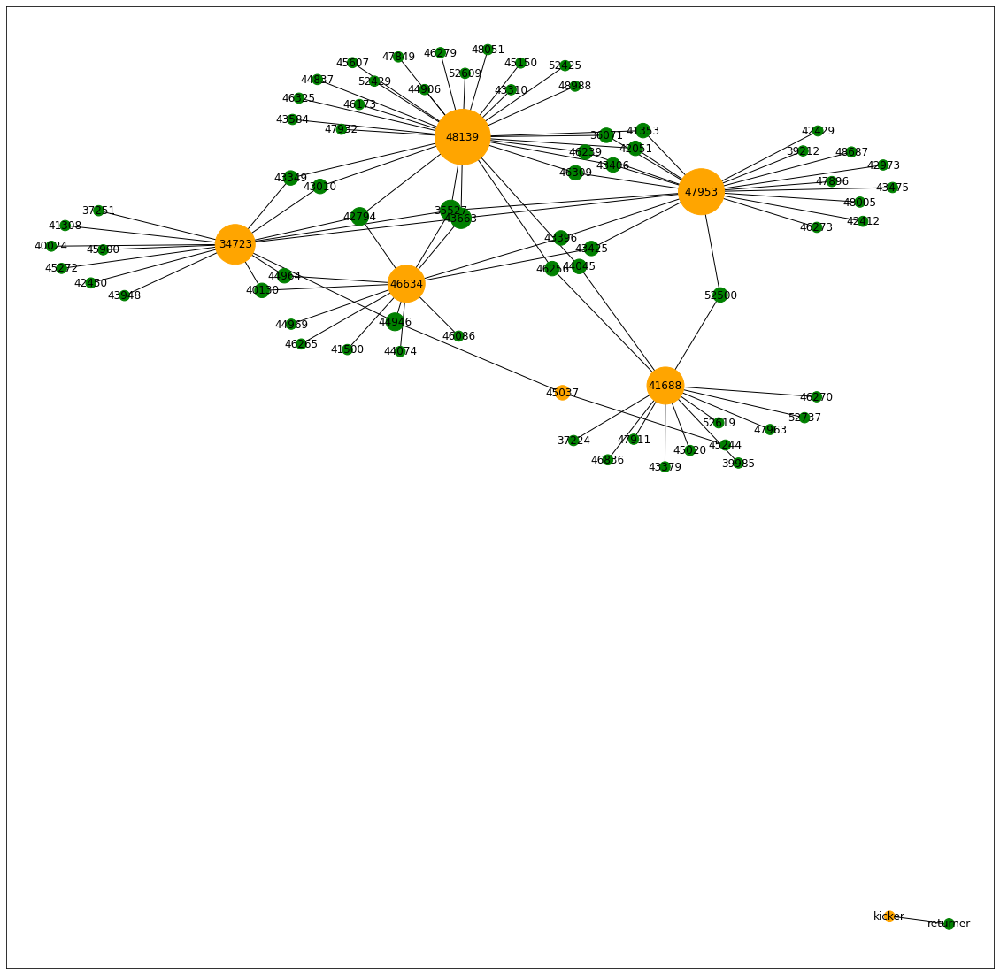

In [37]:
pl_df = pd.read_csv('CLE.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner')
# set layout (node position)
pos = nx.spring_layout(pl_graph)


#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

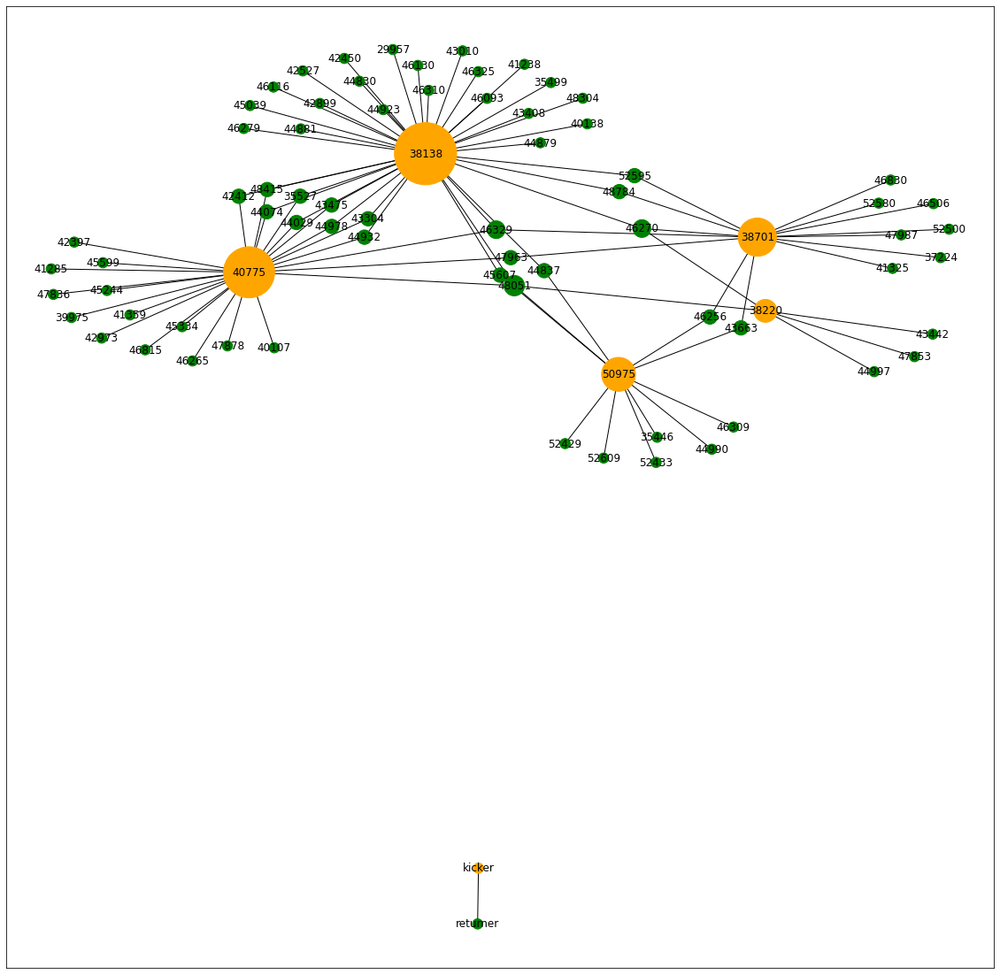

In [15]:
pl_df = pd.read_csv('DAL.txt', names=['kicker', 'returner'], sep='\t')

# set layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

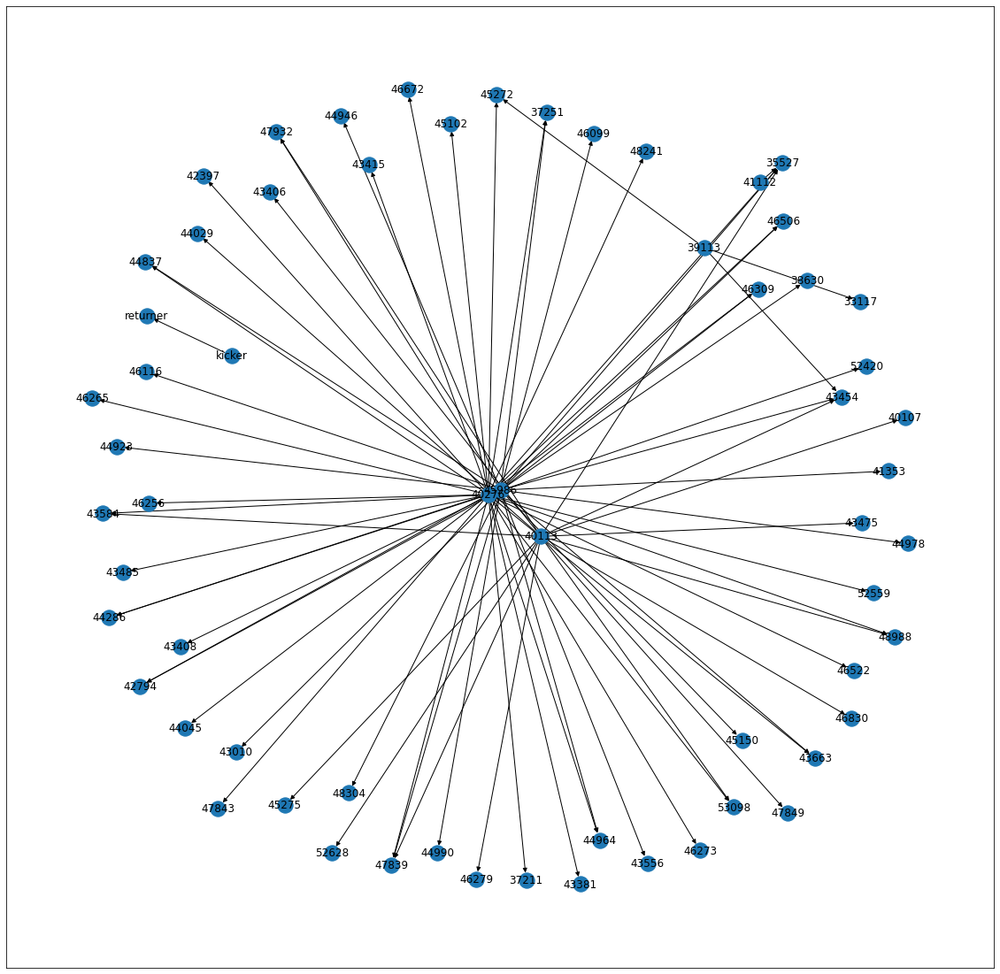

In [31]:
pl_df = pd.read_csv('DEN.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

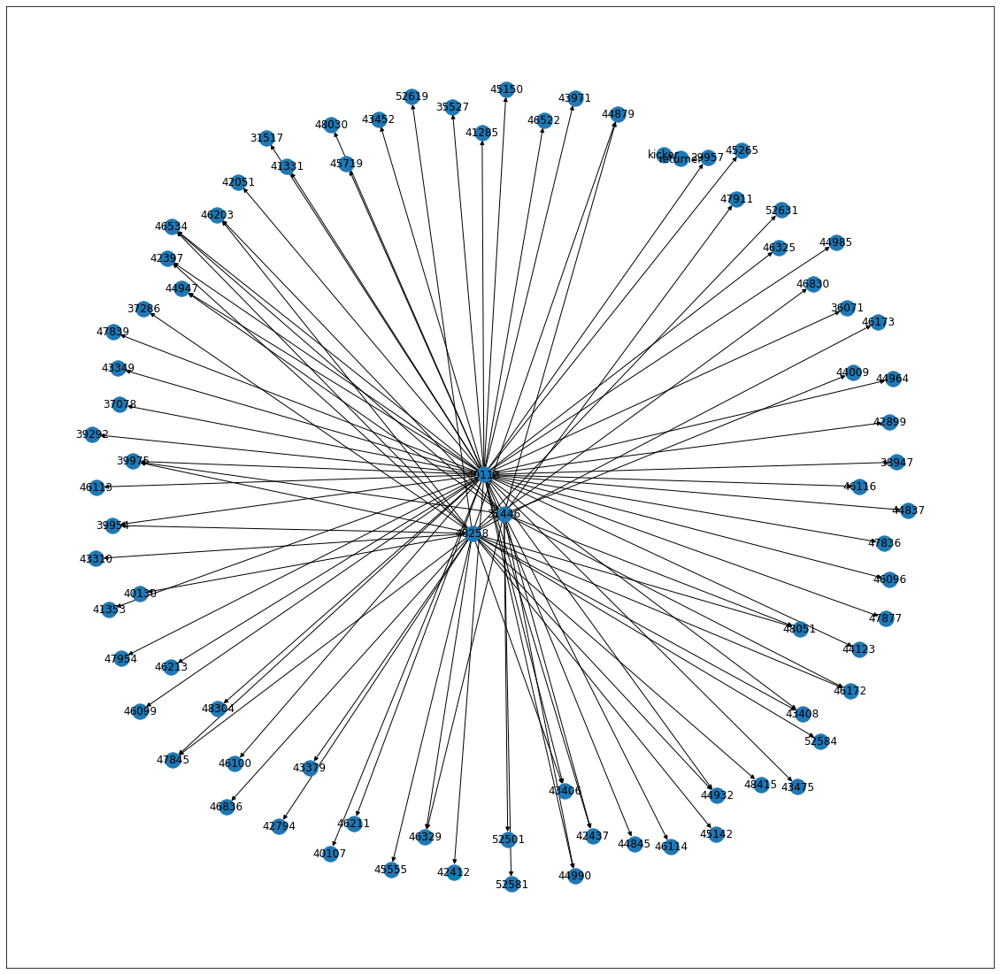

In [23]:
pl_df = pd.read_csv('DET.txt', names=['kicker', 'returner', 'playtype'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

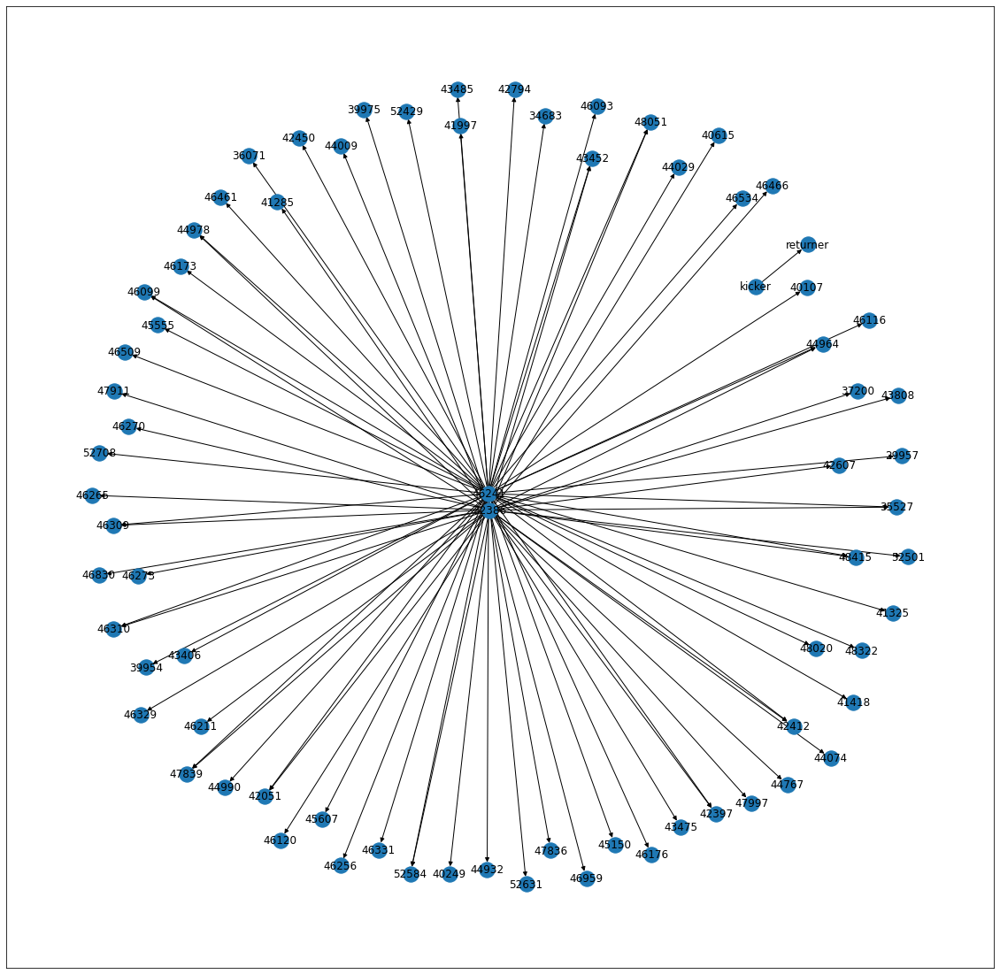

In [32]:
pl_df = pd.read_csv('GB.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

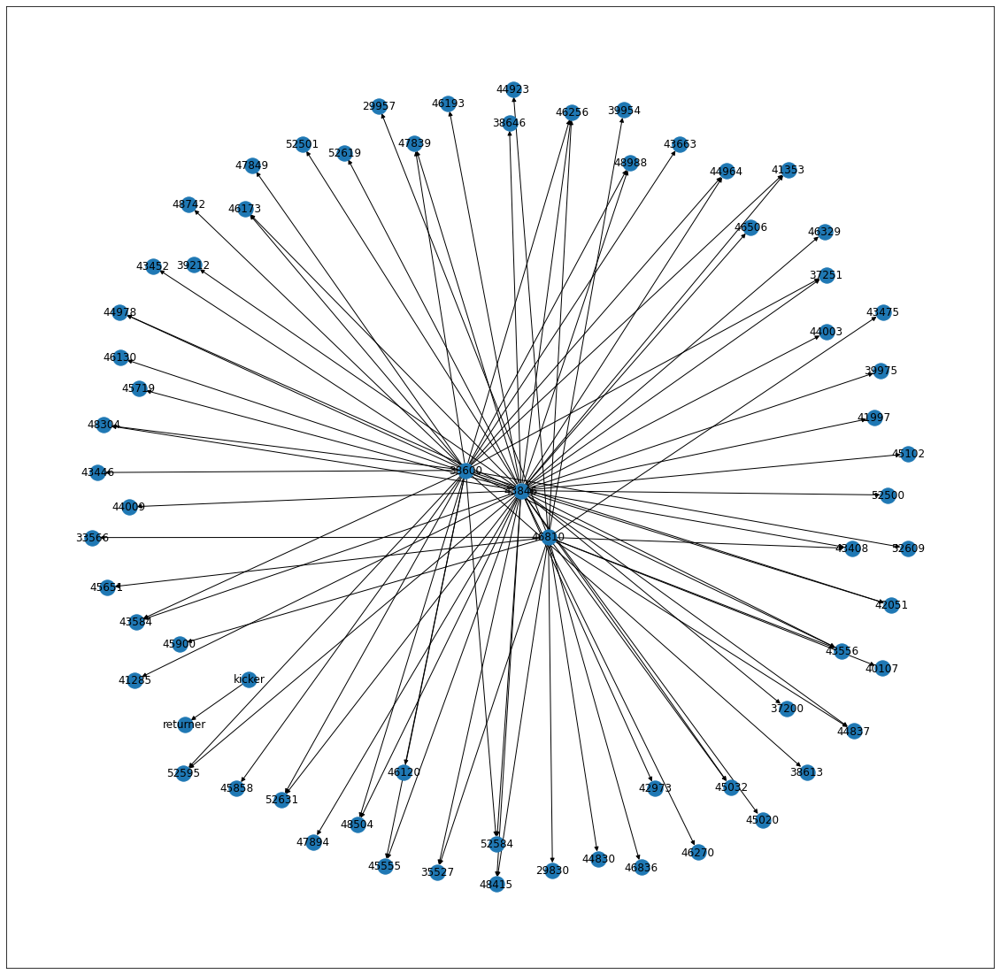

In [33]:
pl_df = pd.read_csv('HOU.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

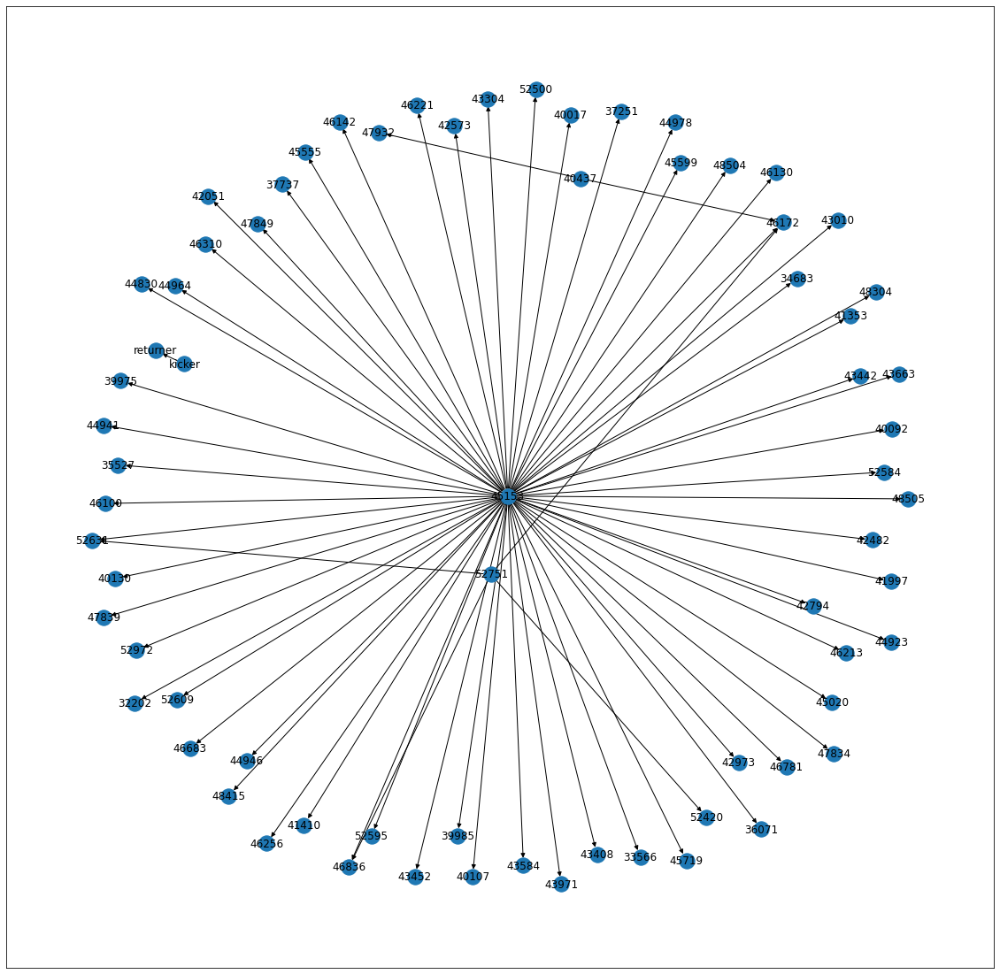

In [34]:
pl_df = pd.read_csv('IND.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

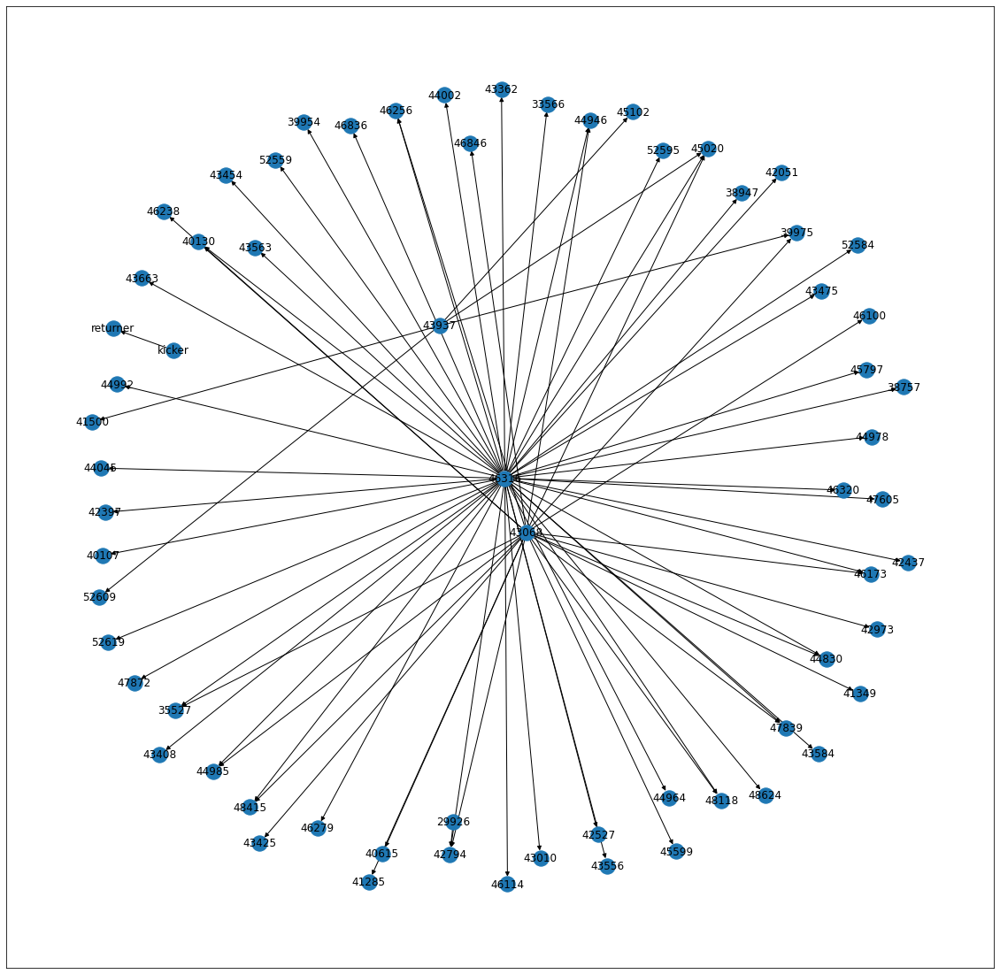

In [35]:
pl_df = pd.read_csv('JAX.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

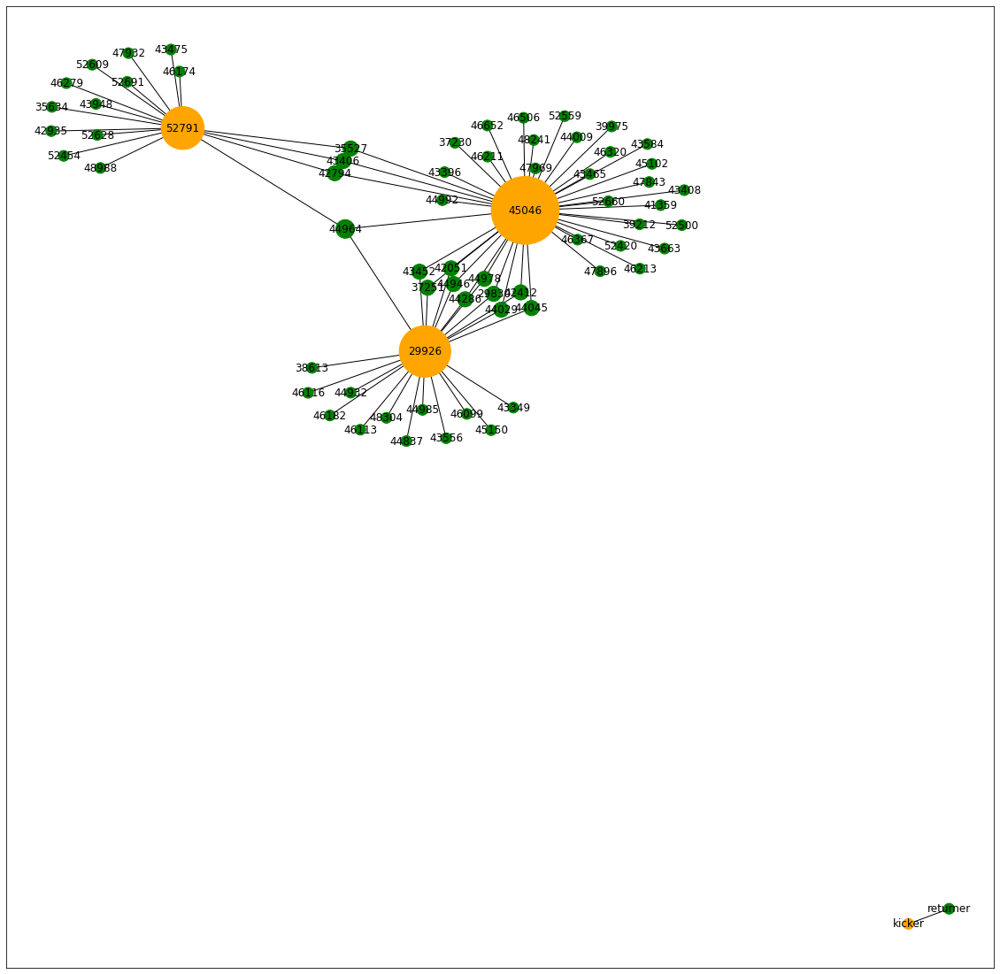

In [25]:
pl_df = pd.read_csv('KC.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner')
# set layout (node position)
pos = nx.spring_layout(pl_graph)




#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

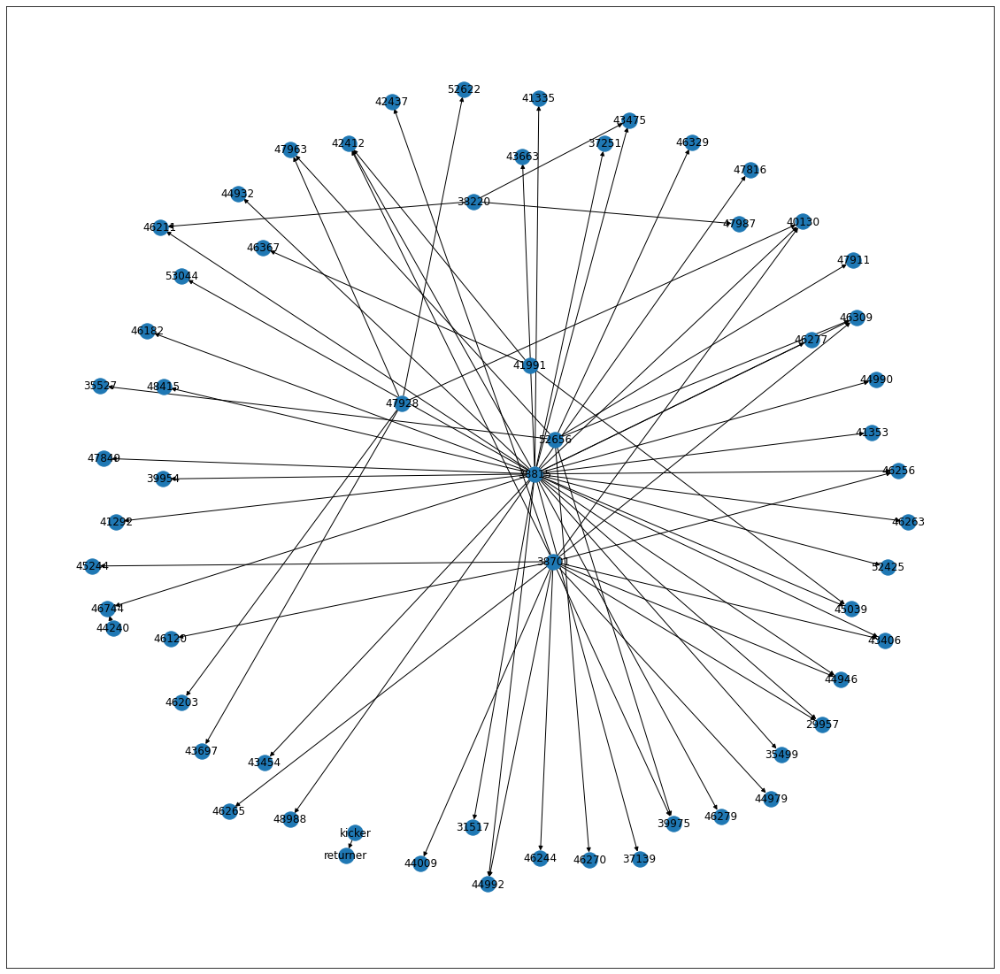

In [37]:
pl_df = pd.read_csv('LA.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

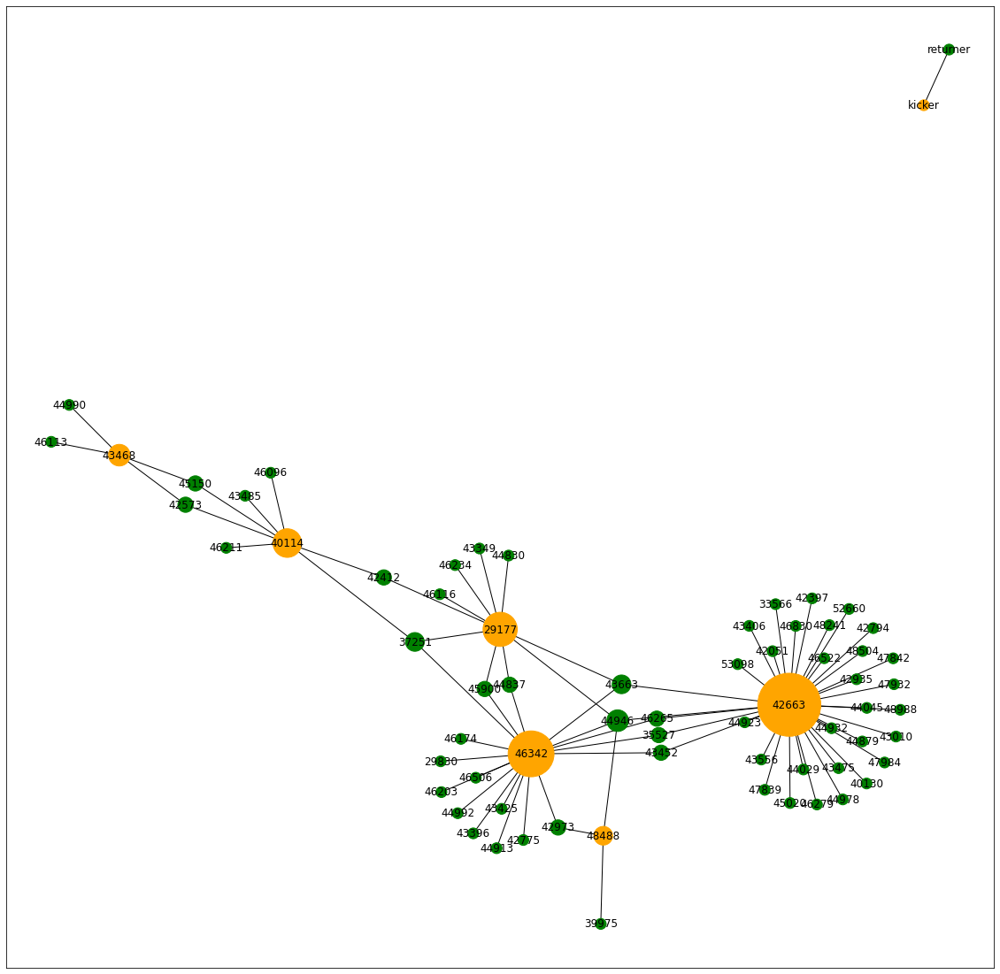

In [39]:
pl_df = pd.read_csv('LAC.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner')
# set layout (node position)
pos = nx.spring_layout(pl_graph)


#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

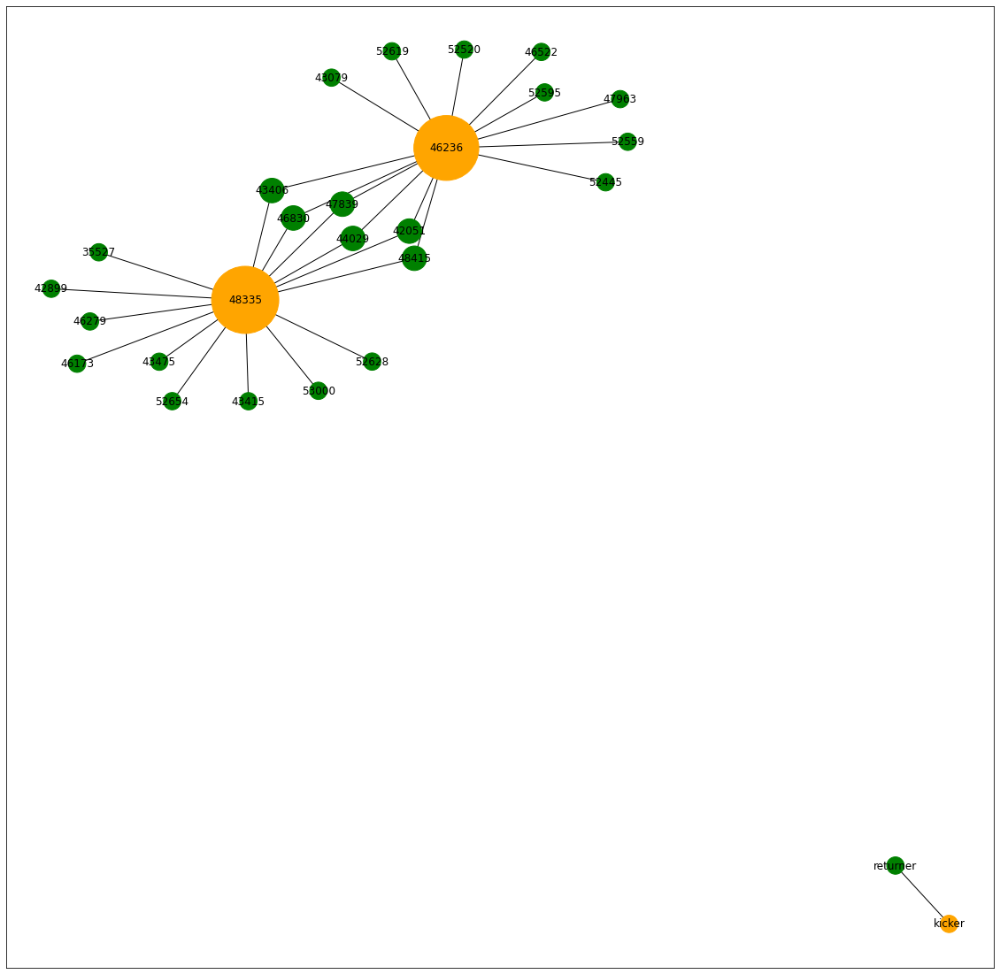

In [21]:
pl_df = pd.read_csv('LV.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner')
# set layout (node position)


# set layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

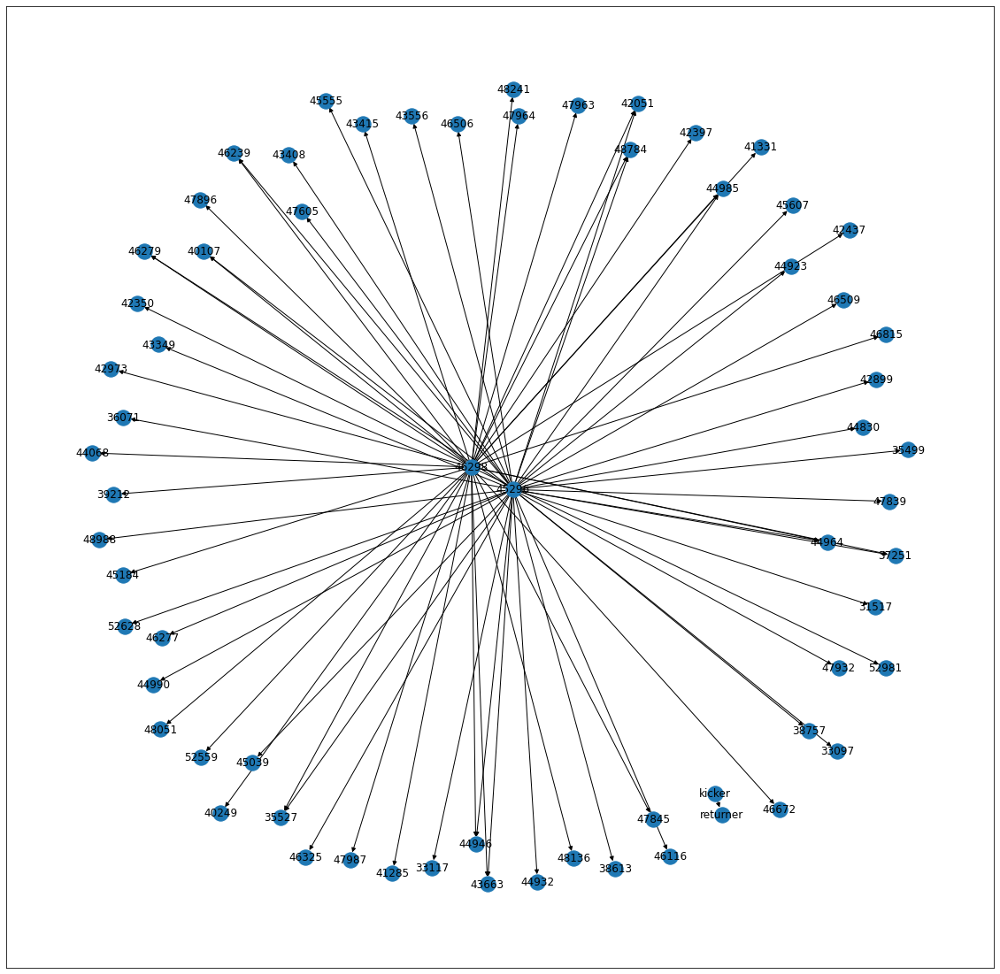

In [40]:
pl_df = pd.read_csv('MIA.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

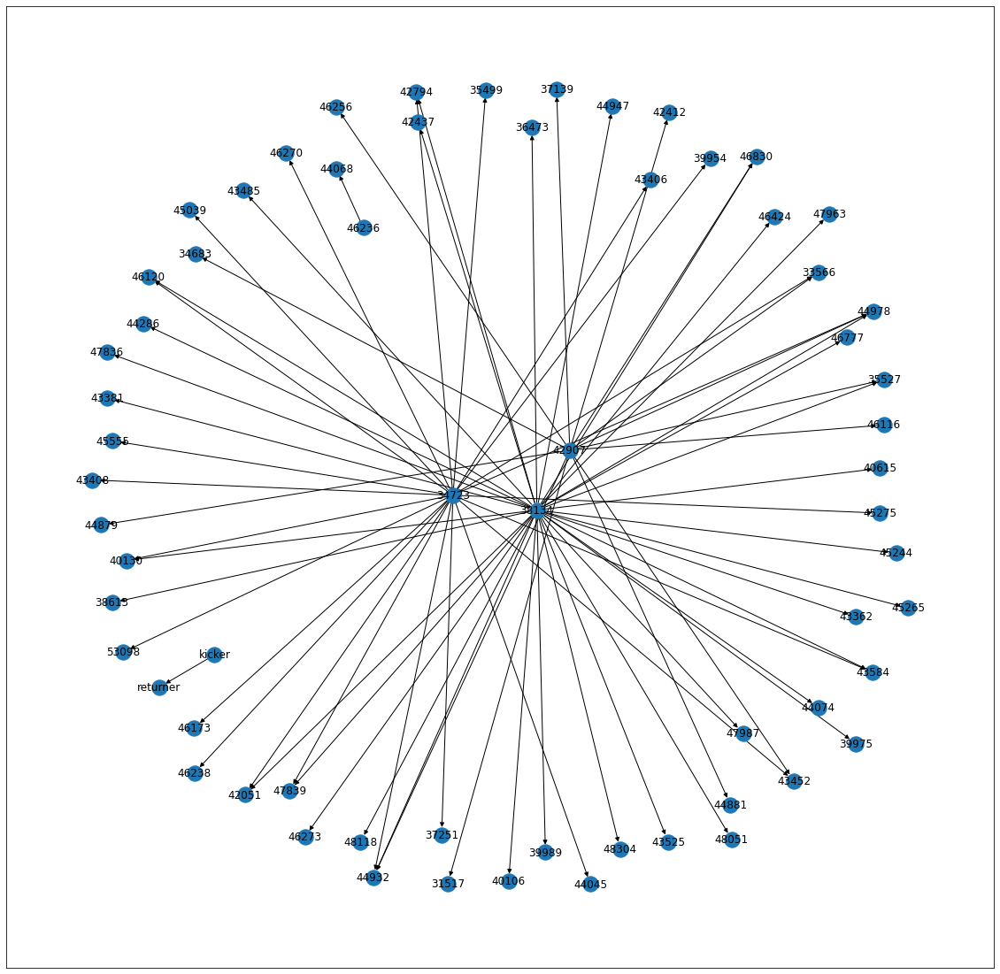

In [41]:
pl_df = pd.read_csv('MIN.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

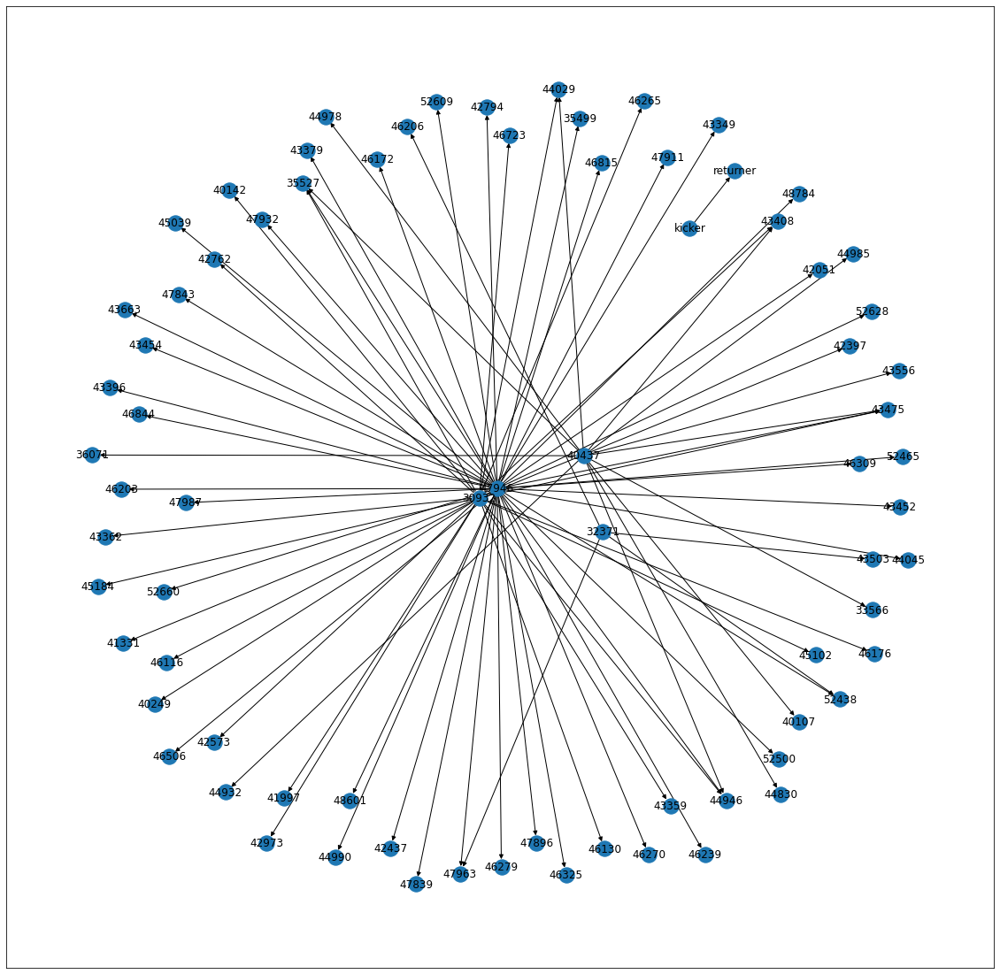

In [42]:
pl_df = pd.read_csv('NE.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

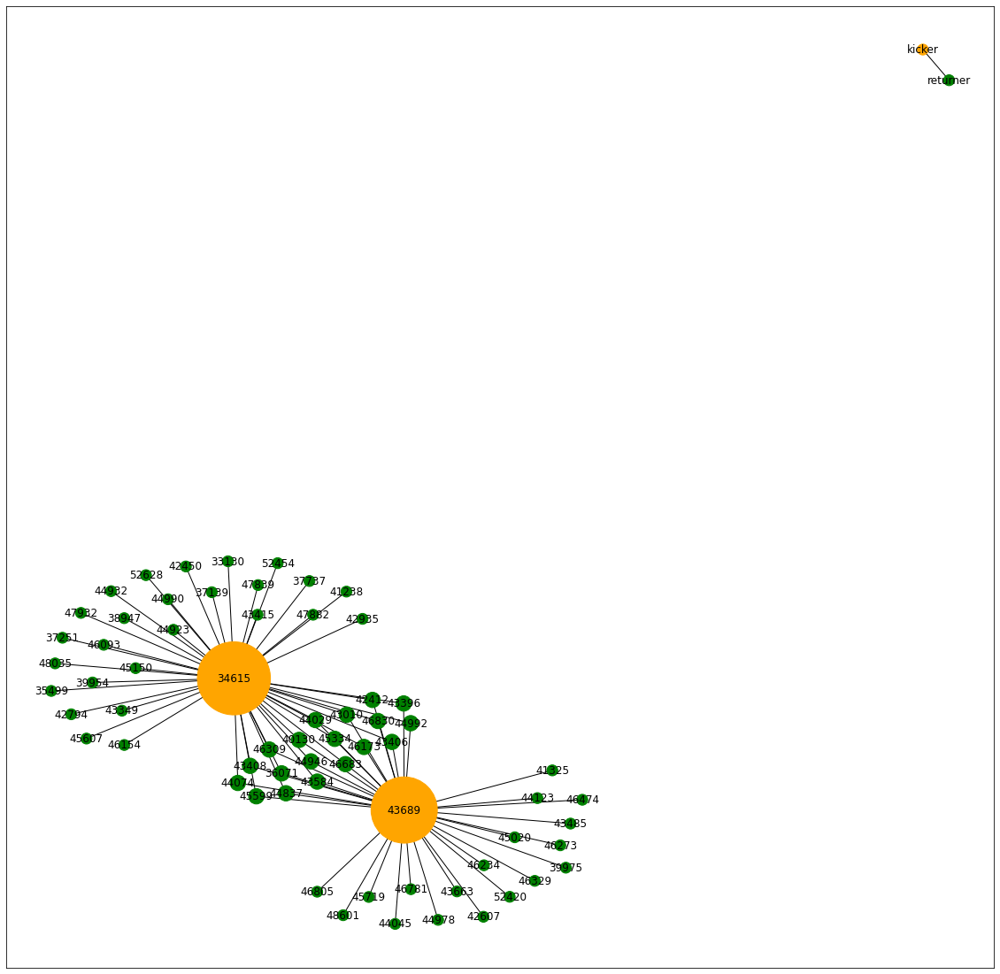

In [23]:
pl_df = pd.read_csv('NO.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner')
# set layout (node position)
pos = nx.spring_layout(pl_graph)



#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

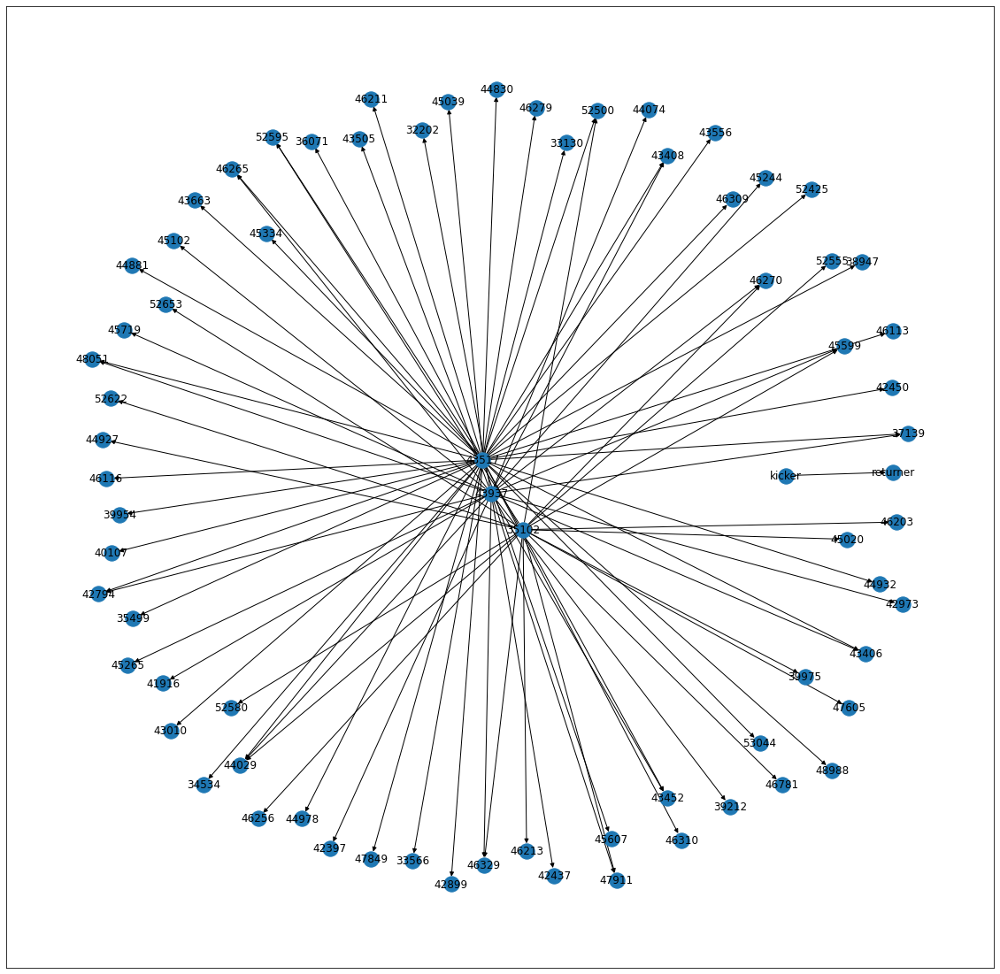

In [21]:
pl_df = pd.read_csv('NYG.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

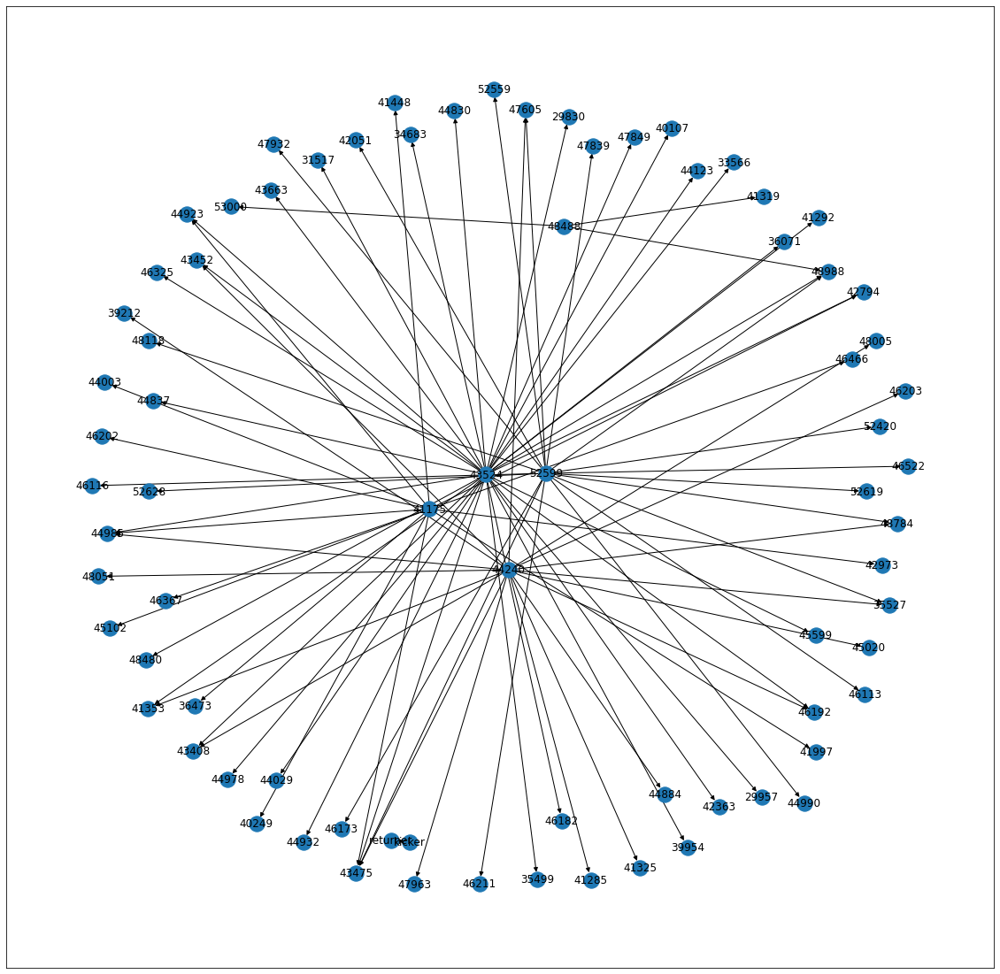

In [20]:
pl_df = pd.read_csv('NYJ.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

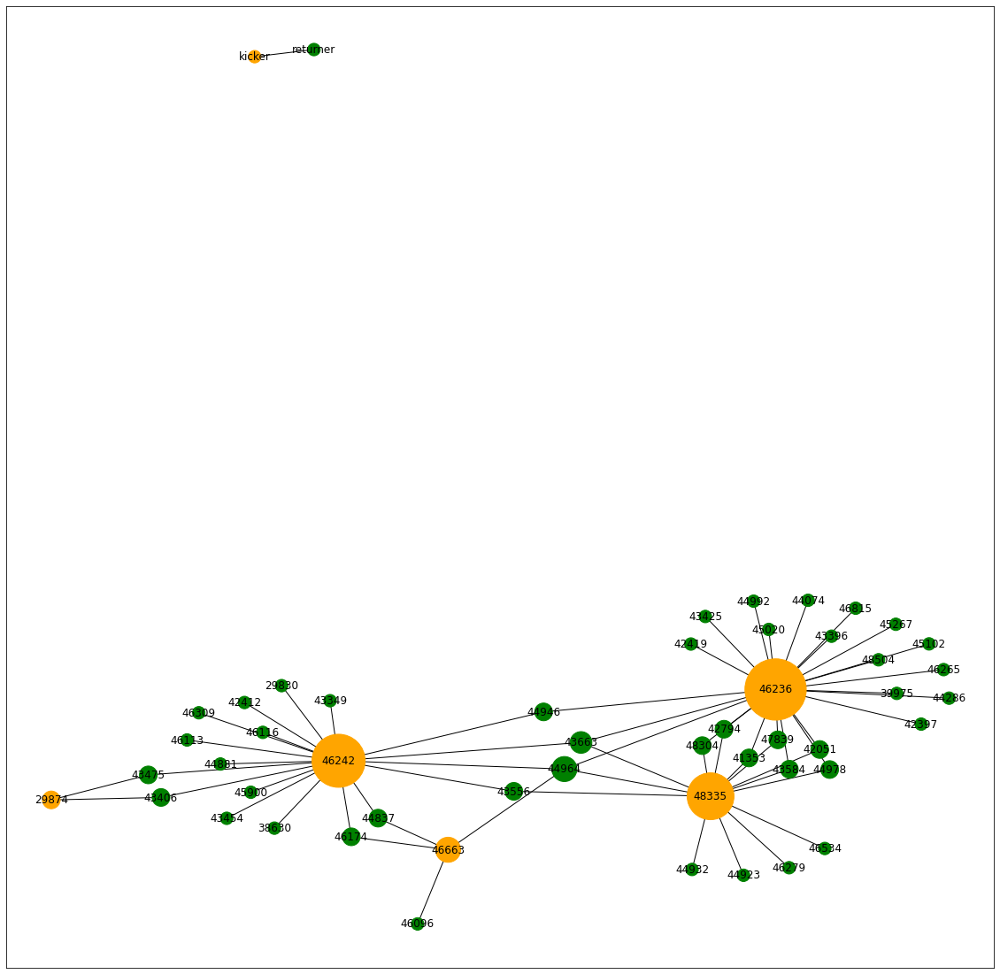

In [32]:
pl_df = pd.read_csv('OAK.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner')
# set layout (node position)
pos = nx.spring_layout(pl_graph)



#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

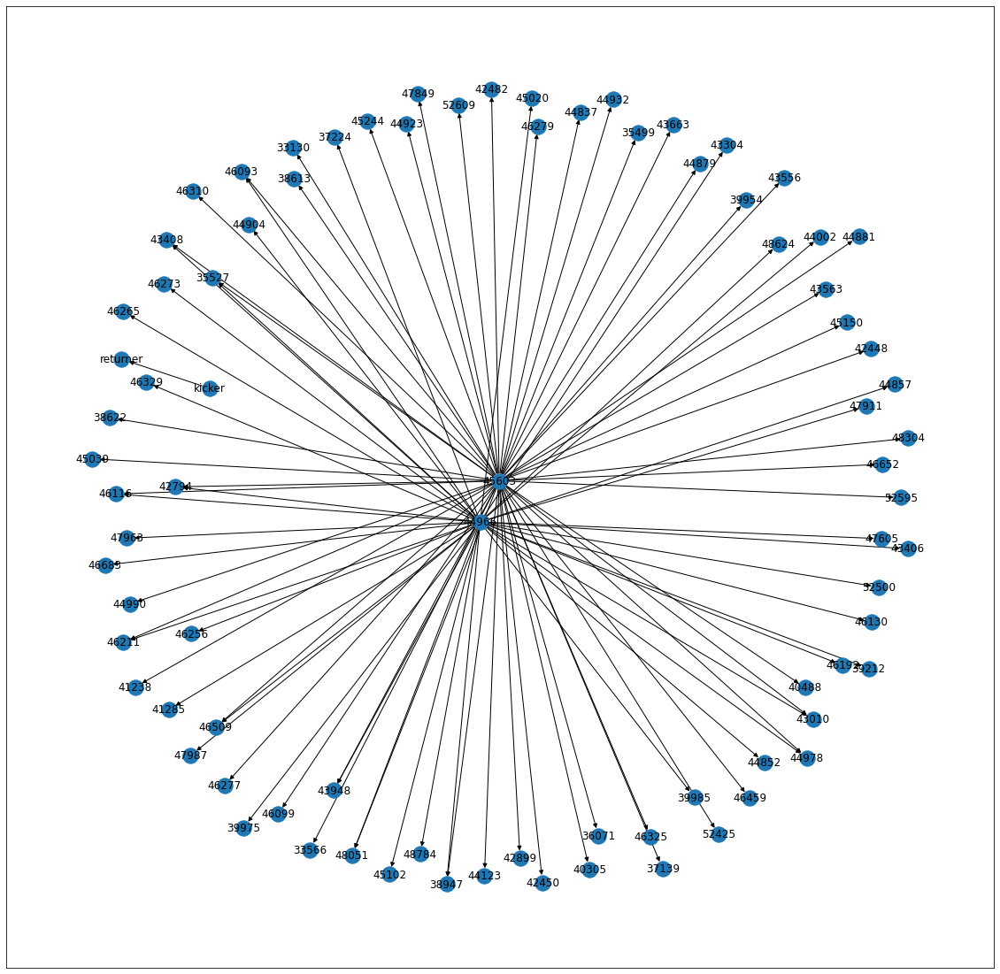

In [18]:
pl_df = pd.read_csv('PHI.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

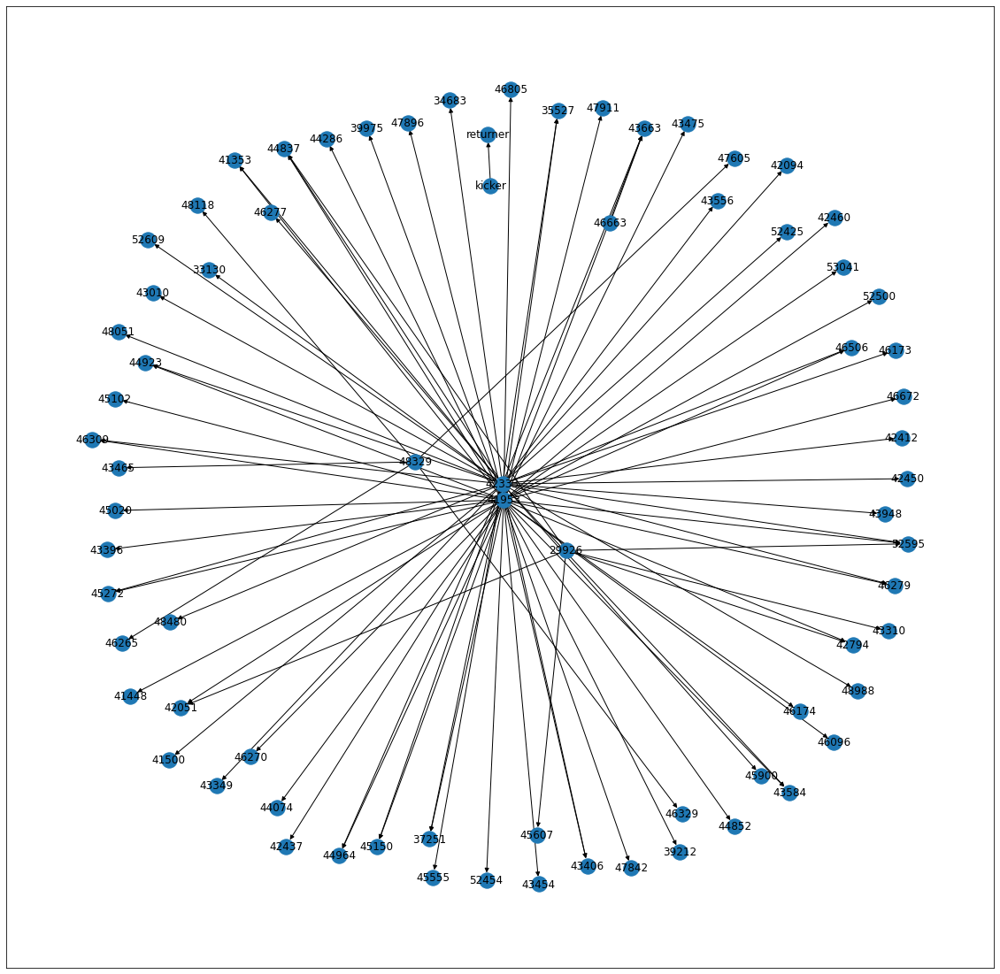

In [17]:
pl_df = pd.read_csv('PIT.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

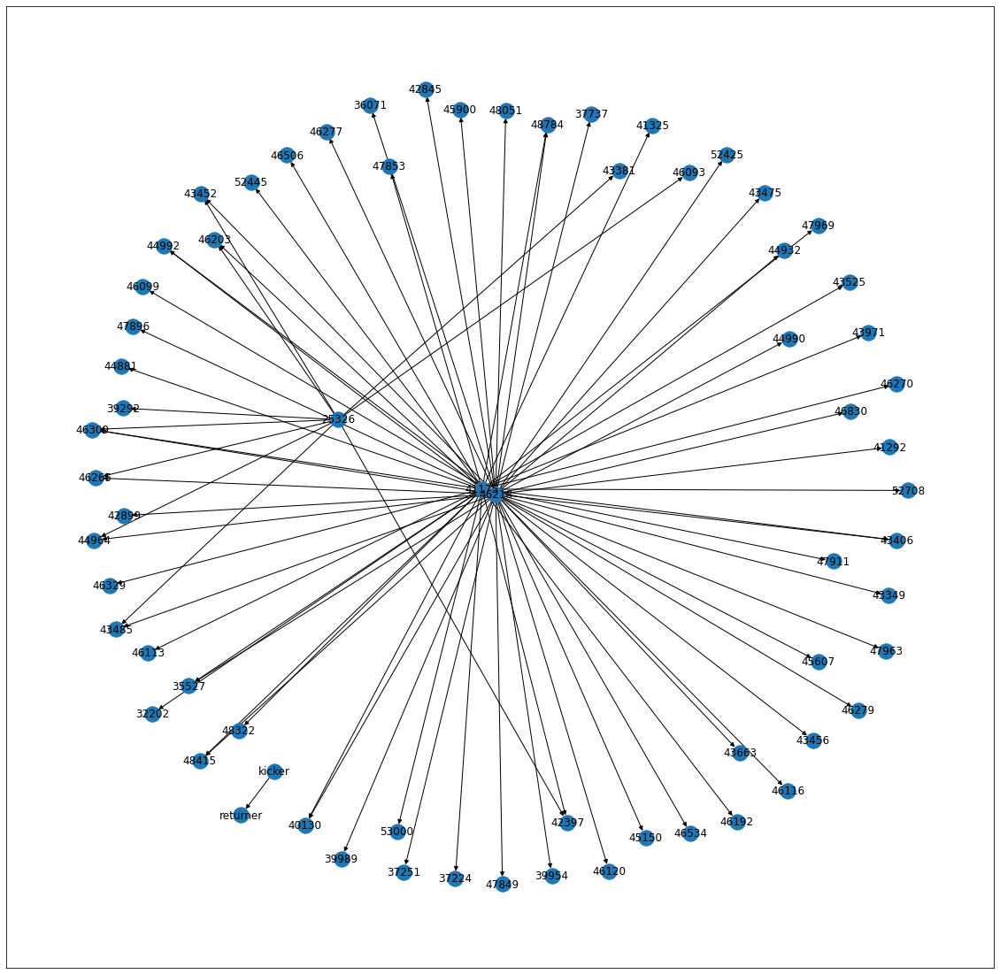

In [16]:
pl_df = pd.read_csv('SEA.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

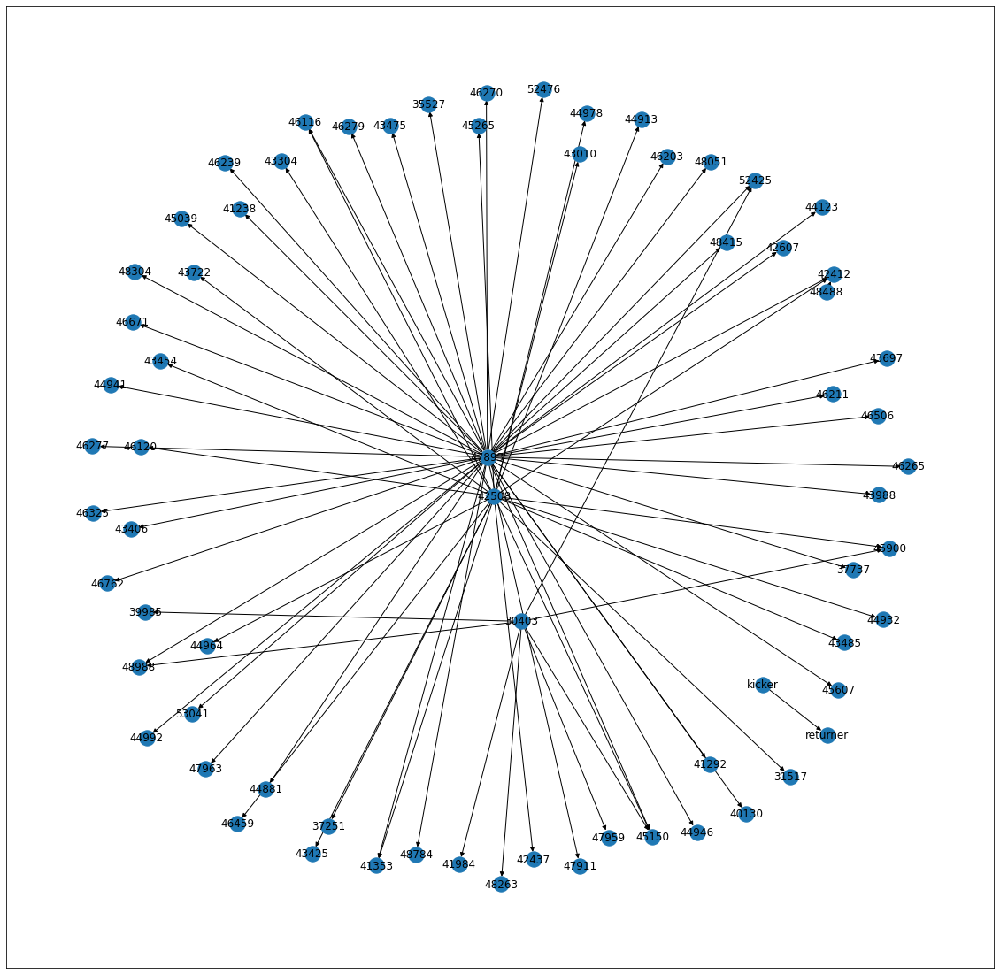

In [14]:
pl_df = pd.read_csv('SF.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

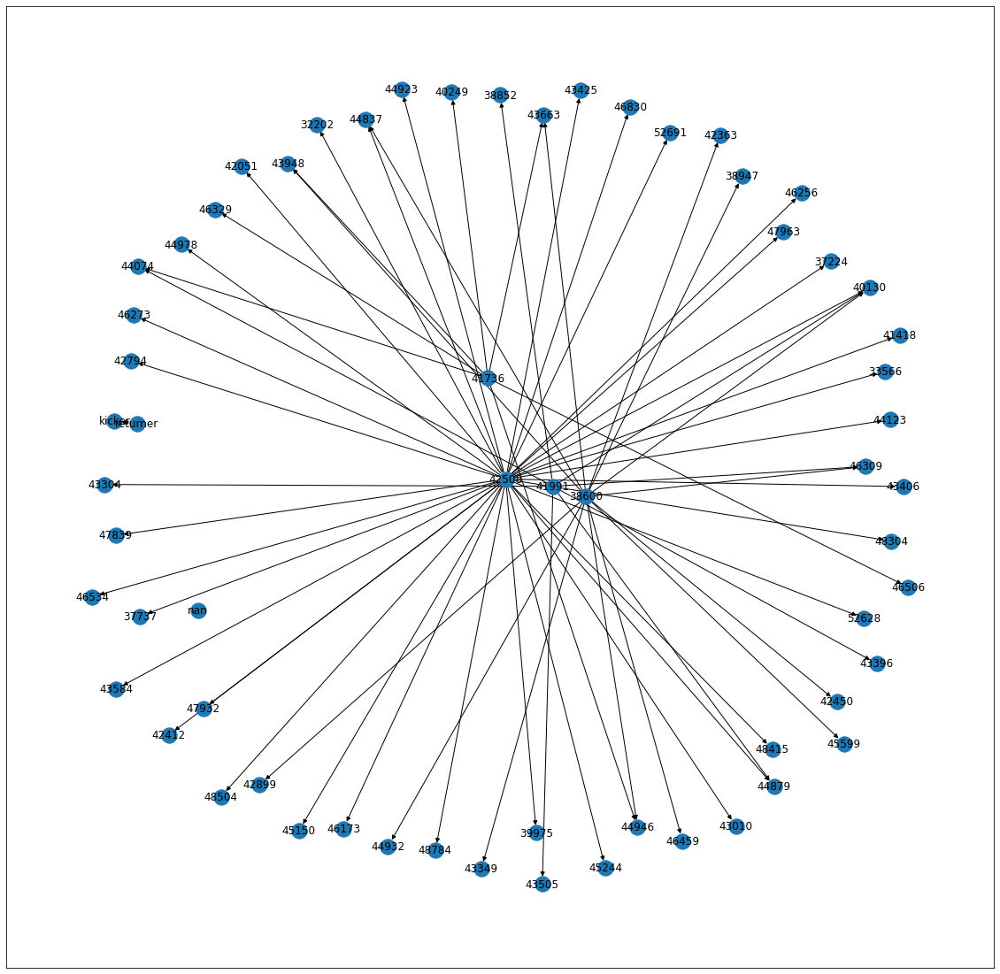

In [12]:
pl_df = pd.read_csv('TB.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

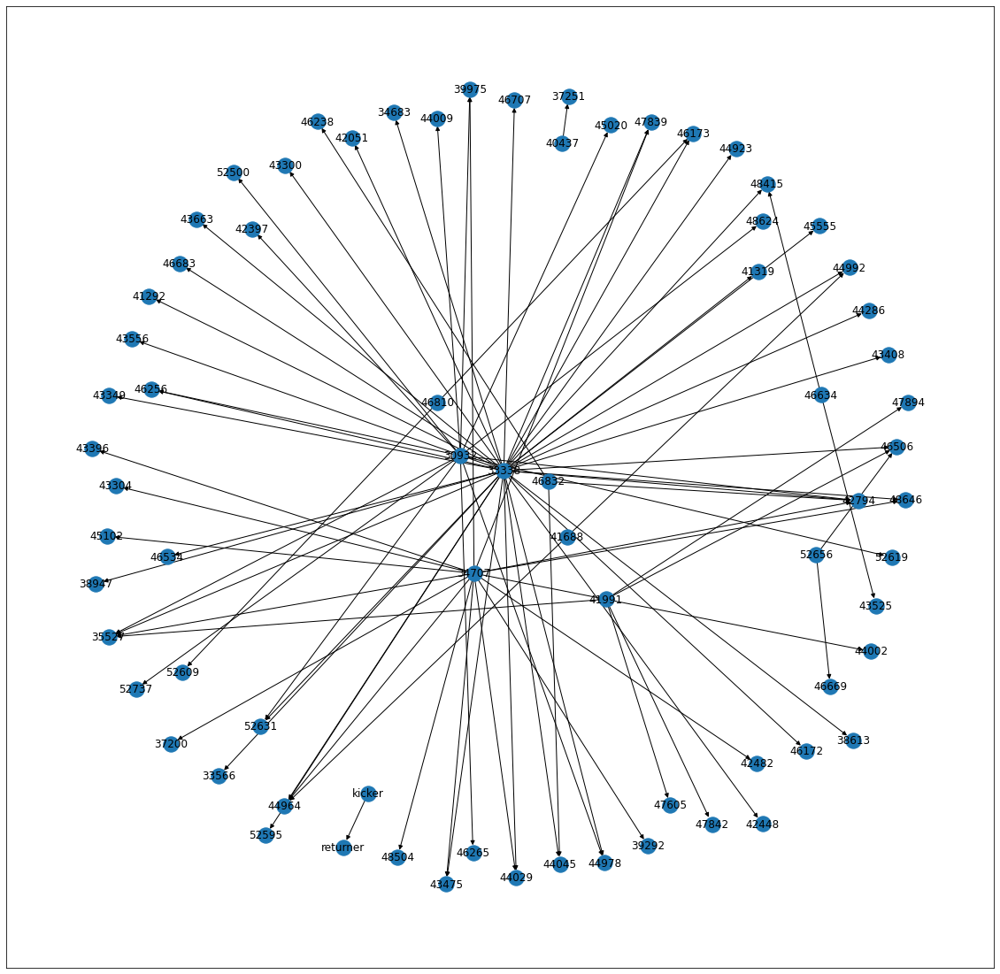

In [10]:
pl_df = pd.read_csv('TEN.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

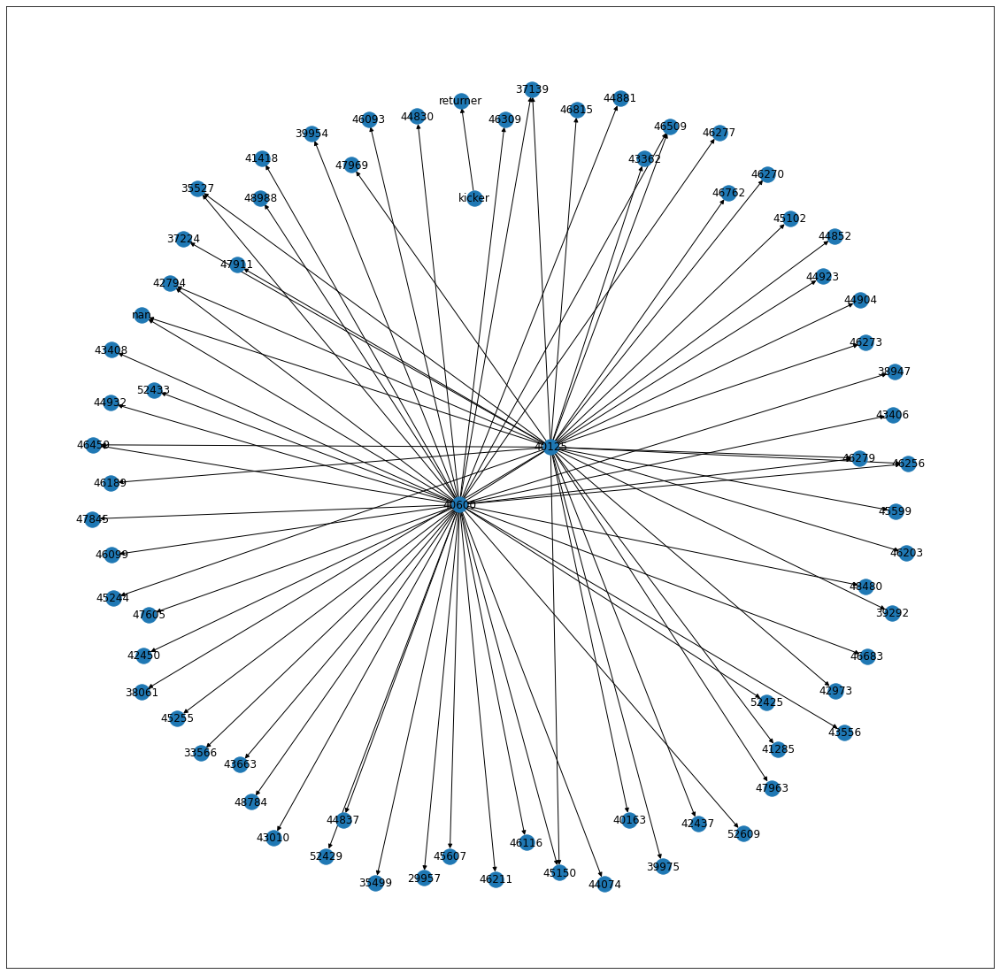

In [116]:
pl_df = pd.read_csv('WAS.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
# set layout (node position)
pos = nx.spring_layout(pl_graph)

plt.figure(figsize=(20,20))

# draw figure with customized options
nx.draw_networkx(pl_graph )

plt.show()

### Q2-3-2

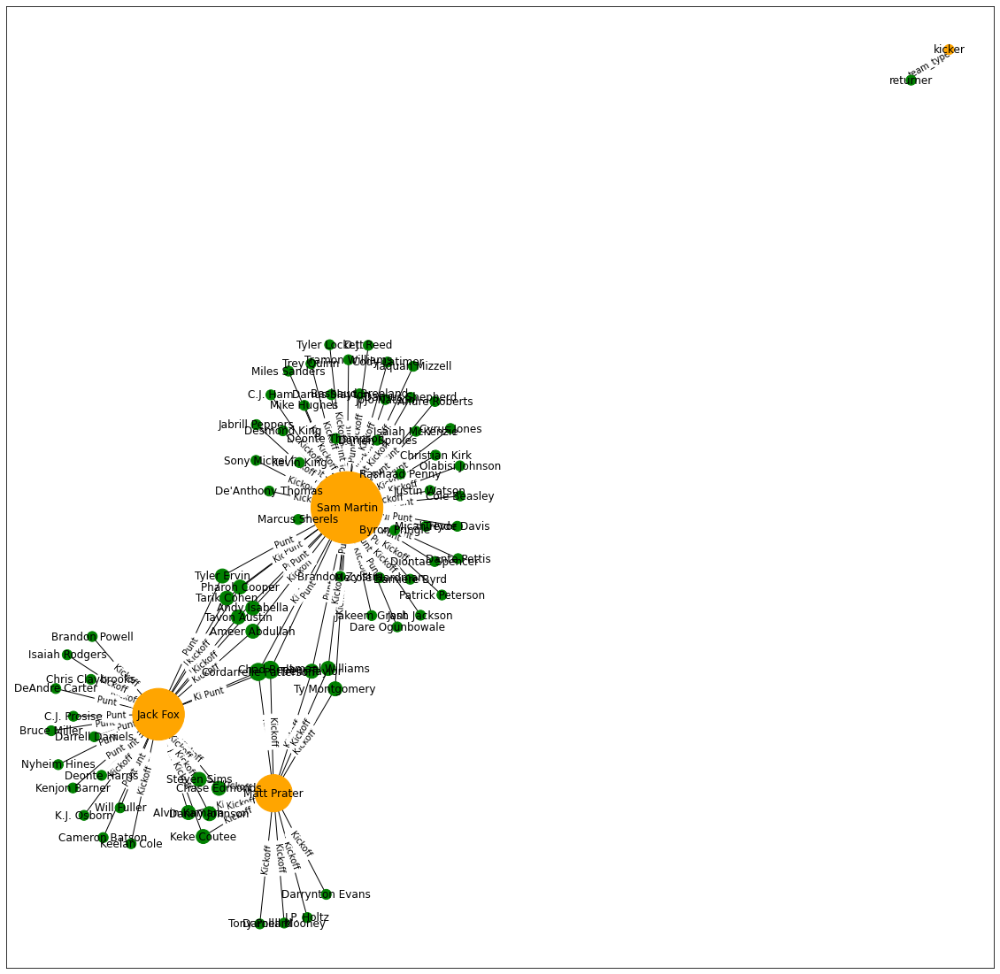

In [8]:
#Print out the graph (with larger size than default) for Team "DET" with player names on nodes. Note that
#The nodes sizes should follow the degree centrality of each node (the larger the centrality, the larger the node).
#The color of kicker node should be orange and the color of returner should be green.
#The edge color should set according to the specialTeamsPlayType (edge attribution)

pl_df = pd.read_csv('DETNN.txt', names=['kicker', 'returner', 'team_type'], sep='\t')


# Read Our Edgelist
#pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', edge_attr='team_type')

# set layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")

#Setting the edge color according to specialTeamPlayType(edge attribution)        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

plt.show()


### Q2-3-3

In [6]:
#Continues from previous question, based on your observation, will you 
#consider it as a bipartie graph? Why? Print it with your ideal layout.

The graph is considered a bipartite graph because we can divide its vertices into 
two independent and disjoint sets of A (kicker) and B (returner) in a way that 
each edge connects a vertex in A to one in B.



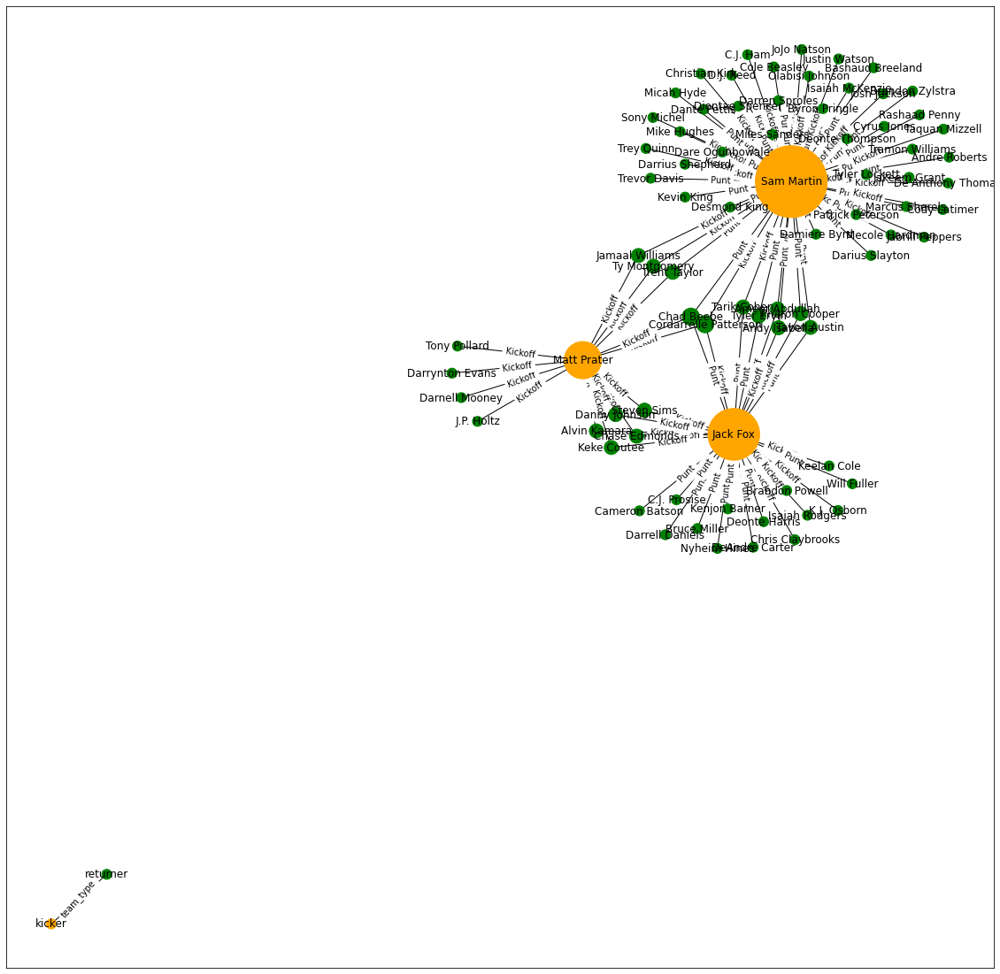

In [7]:

pl_df = pd.read_csv('DETNN.txt', names=['kicker', 'returner', 'team_type'], sep='\t')


# Read Our Edgelist
#pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', edge_attr='team_type')

# set ideal layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")
        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

plt.show()


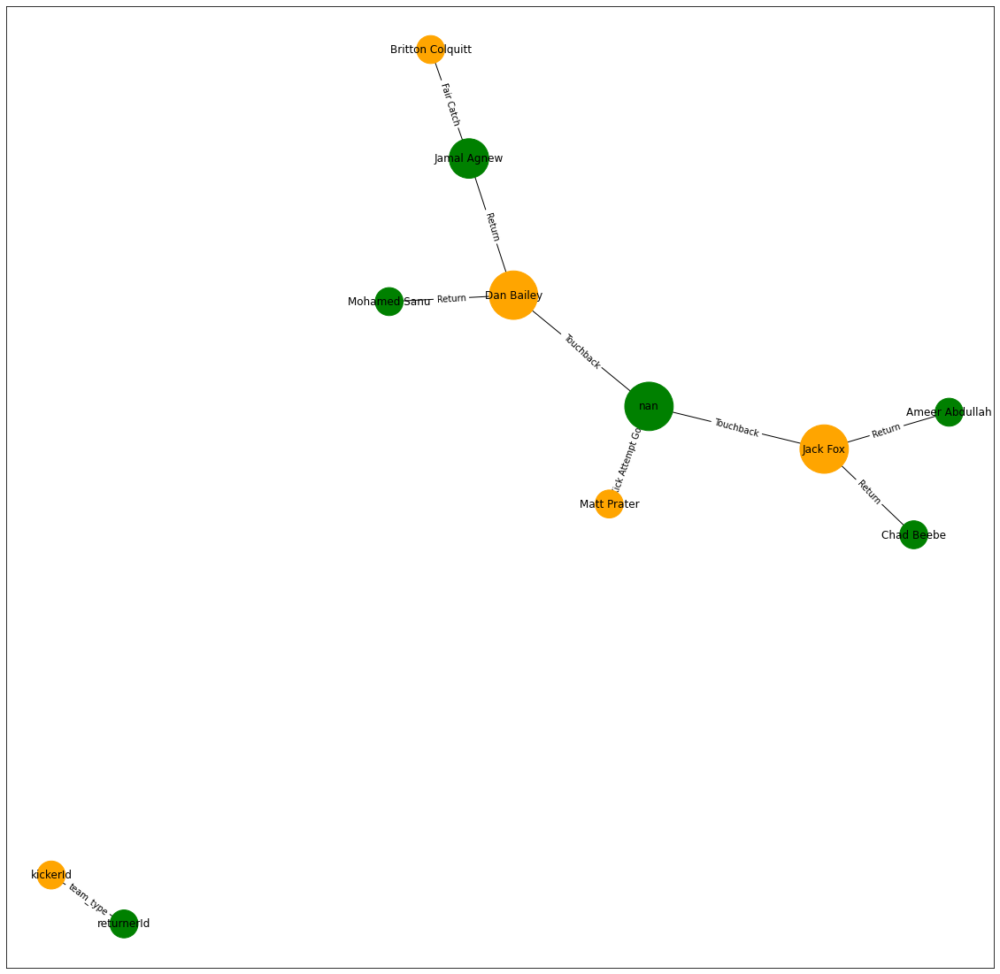

In [4]:
pl_df = pd.read_csv('NFL1.txt', names=['kicker', 'returner', 'team_type'], sep='\t')


# Read Our Edgelist
#pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', edge_attr='team_type')

# set ideal layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["kicker"].values:
        colors.append("orange")
    else: colors.append("green")
        
edge_labels = nx.get_edge_attributes(pl_graph, "team_type")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

plt.show()

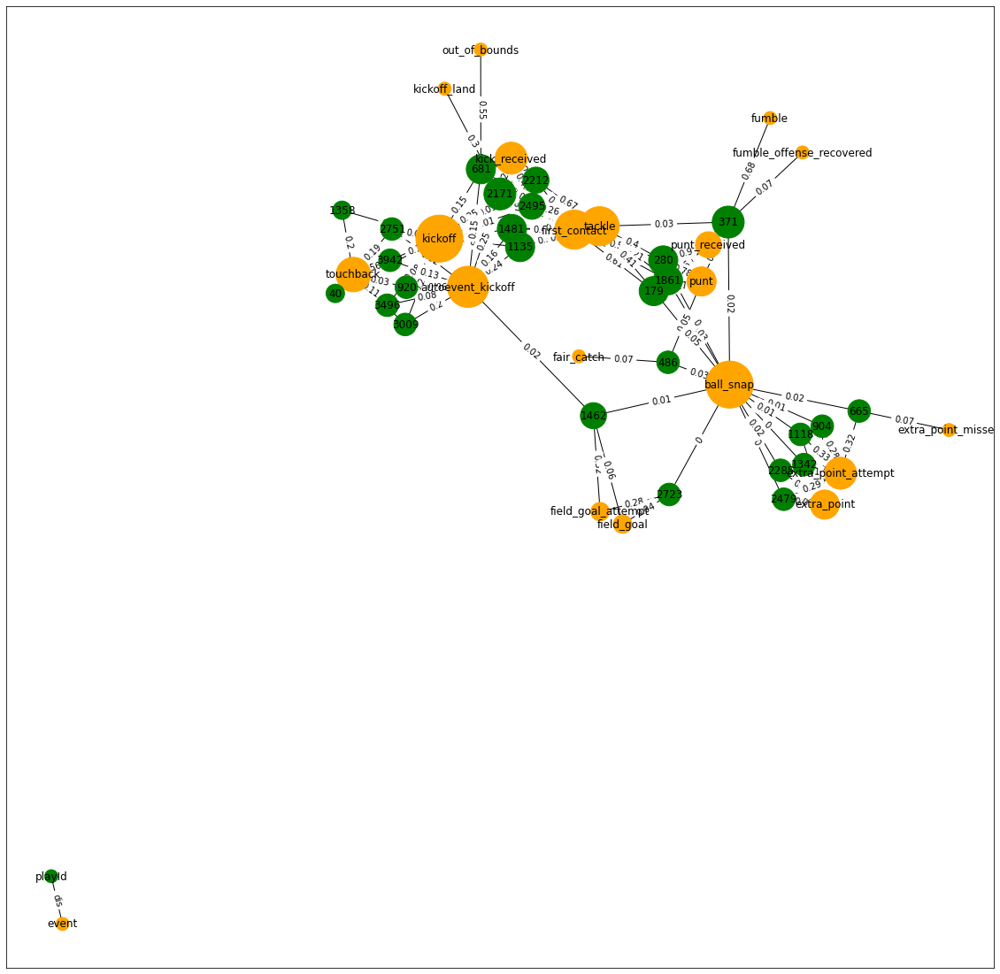

In [10]:
pl_df = pd.read_csv('event.txt', names=['event', 'play', 'dis'], sep='\t')


# Read Our Edgelist
#pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
pl_graph = nx.from_pandas_edgelist(pl_df,source='event',target='play', edge_attr='dis')

# set ideal layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["event"].values:
        colors.append("orange")
    else: colors.append("green")
        
edge_labels = nx.get_edge_attributes(pl_graph, "dis")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

plt.show()

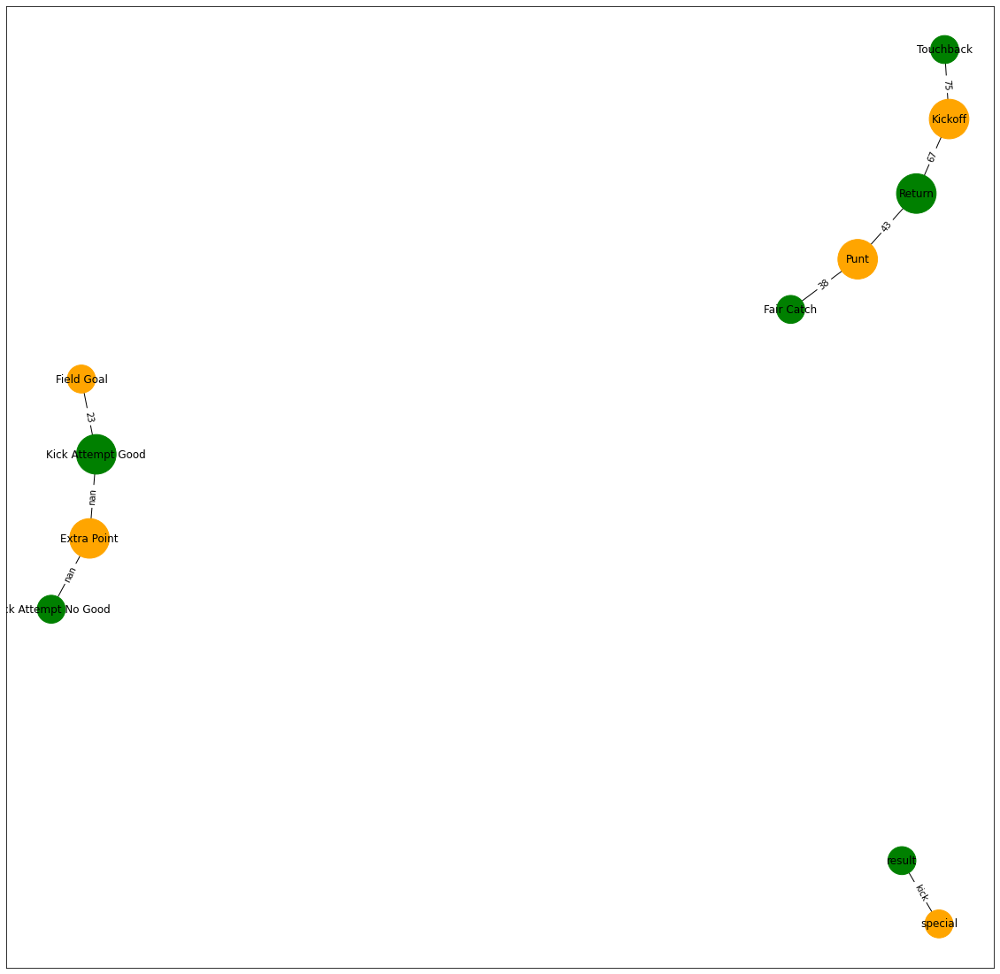

In [12]:
pl_df = pd.read_csv('kickAttempt.txt', names=['special', 'kick', 'result'], sep='\t')


# Read Our Edgelist
#pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
pl_graph = nx.from_pandas_edgelist(pl_df,source='special',target='result', edge_attr='kick')

# set ideal layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["special"].values:
        colors.append("orange")
    else: colors.append("green")
        
edge_labels = nx.get_edge_attributes(pl_graph, "kick")
nx.draw_networkx_edge_labels(pl_graph, pos, edge_labels)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

plt.show()

In [ ]:
list(nx.jaccard_coefficient(G))[:15]





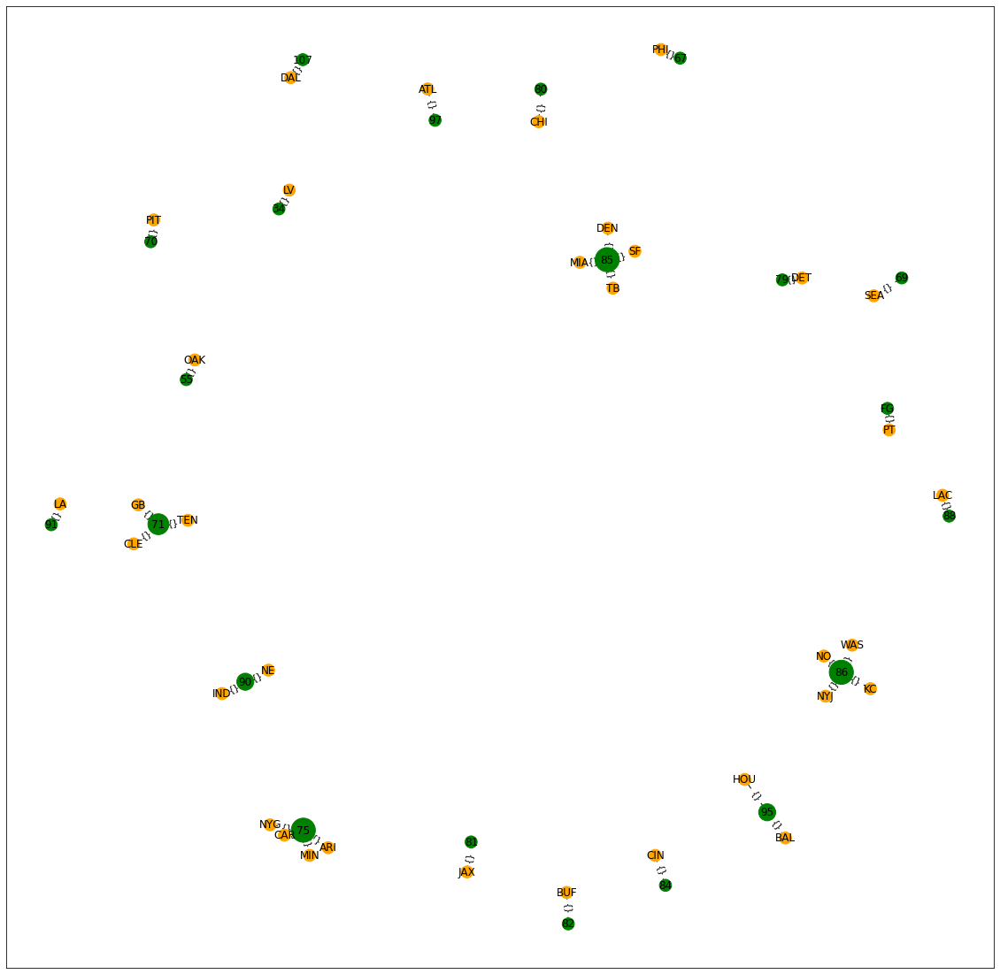

In [13]:
pl_df = pd.read_csv('POSSESSIONTEAM.txt', names=['PT', 'FG'], sep='\t')

# Read Our Edgelist
#pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())
pl_graph = nx.from_pandas_edgelist(pl_df,source='PT',target='FG')

# set ideal layout (node position)
pos = nx.spring_layout(pl_graph)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph:
    if node in pl_df["PT"].values:
        colors.append("orange")
    else: colors.append("green")
        
#edge_labels = nx.get_edge_attributes(pl_graph, "kick")
nx.draw_networkx_edge_labels(pl_graph, pos)


# draw figure with customized options
nx.draw_networkx(pl_graph, pos=pos, node_color=colors, with_labels=True,node_size=node_size  )

plt.show()

### Q 2-3-4

80


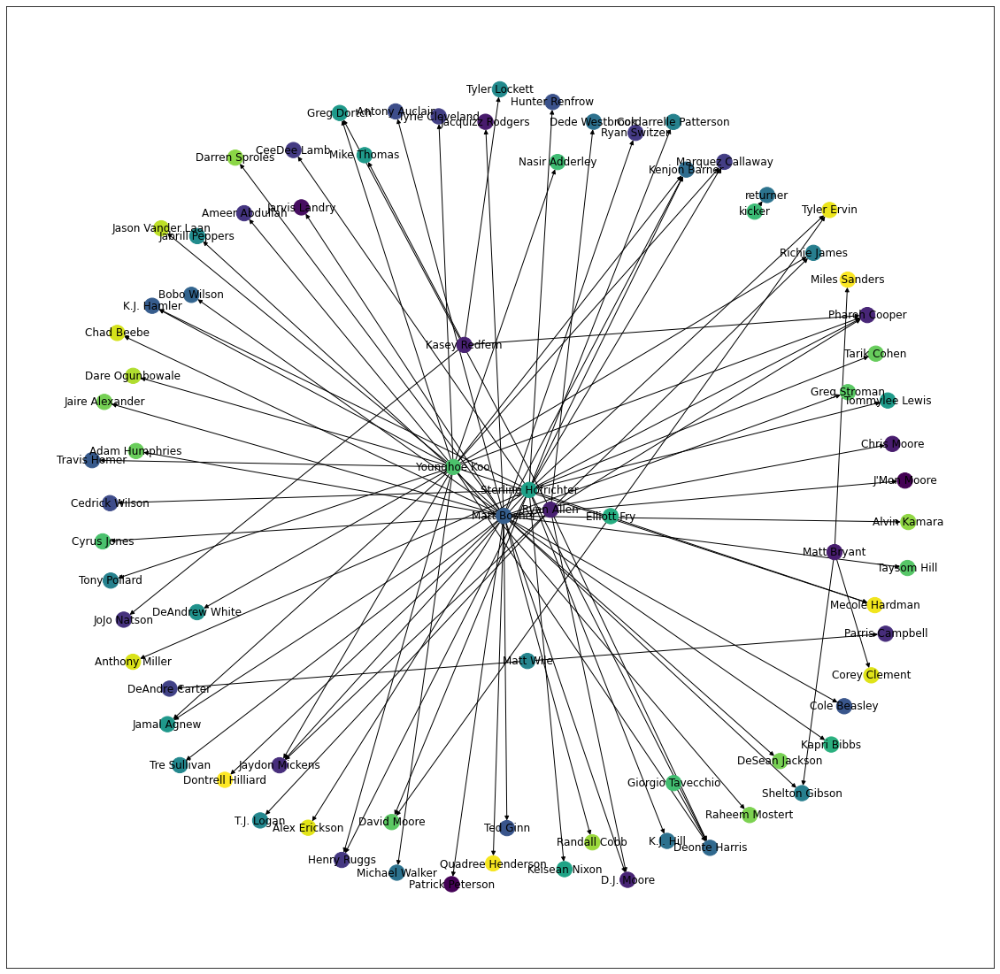

In [4]:
pl_df = pd.read_csv('ATLN.txt', names=['kicker', 'returner'], sep='\t')

# Read Our Edgelist
pl_graph = nx.from_pandas_edgelist(pl_df,source='kicker',target='returner', create_using=nx.DiGraph())


#get random colors with size 256        
my_color = list(np.random.choice(range(256), size=256))

#initialize our unique color list to empty
unique_colors=[]

#get the number of nodes in the graph
nodes_length=nx.number_of_nodes(pl_graph)

#compute the unique nodes with size=nodes_length
counter=0
for n in my_color:
    if (n not in unique_colors):
        unique_colors.append(n)
        counter=counter+1
    if(counter==nodes_length):
        break
        


plt.figure(figsize=(20,20))

# draw figure with customized options

# draw figure with customized options
nx.draw_networkx(pl_graph, node_color=unique_colors, with_labels=True)


plt.show()

## Q3 Graph Analysis

### Q3-1

In [ ]:
#Given the directed graph of Team "DET", which player acts the most similar functionality as player `40113`? Why?
Player 48258 has the most similar functionality as player 40113 because player 48258 share many of the same successor
with player 40113 in the graph.


### Q3-2

In [ ]:
#Given the directed graph of Team "ATL", which player do you think is the most important player in the Team 
#from graph's view? Why?

The most important player in the Team is player 37267. The reason is because a careful look at the directed graph
shows that player 37267 has the highest links to other players in the graph. In other words, player 37267 is connected
to many other players compared to other players in the graph.

## Bonus

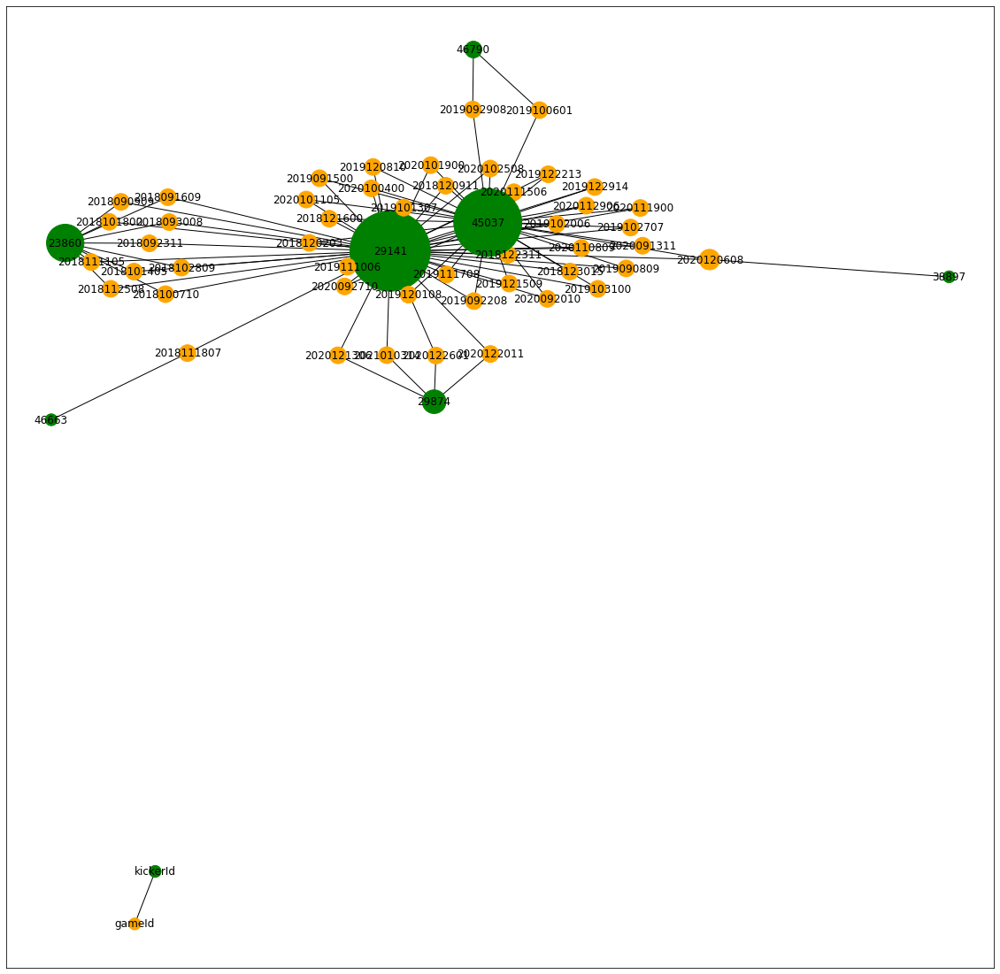

In [62]:
# Construct any other graphs using the nfl-big-data-bowl-2022 datasets and provide more than 2 graph-related 
#analyses/insides in your own words. Note that you are allowed to use any other data apart from plays.csv.


pl_df = pd.read_csv('ARI_Game.txt', names=['gameld', 'kickerld'], sep='\t')


# Read Our Edgelist

pl_graph1 = nx.from_pandas_edgelist(pl_df,source='gameld',target='kickerld')

        

# set layout (node position)
pos = nx.spring_layout(pl_graph1)

#calculate the degree centrality
degCent = nx.degree_centrality(pl_graph1)

#size of each node based on the degree centrality
node_size =  [v * 10000 for v in degCent.values()]

# set the size of our figure
plt.figure(figsize=(20,20))

#set colors for each node based on the column
colors=[]
for node in pl_graph1:
    if node in pl_df["gameld"].values:
        colors.append("orange")
    else: colors.append("green")

# draw figure with customized options
nx.draw_networkx(pl_graph1, pos=pos, node_color=colors, with_labels=True,
                 node_size=node_size )

plt.show()

In [ ]:
#Graph analysis 1

# To view the number of players that played a particular game
#list(nx.degree(pl_graph1))


#Graph analysis 2


#Graph analysis 3

# To view the shortest path betwwen player 38897 and player 29874
#nx.shortest_path(pl_graph1, 38897, 29874)






In [ ]:
#Graph Analysis 1
# get the number of players that played a particular game
list(nx.degree(pl_graph1))

In [39]:
#Graph Analysis 2
# get the Neighbor of player 46790
list(pl_graph1.neighbors('46790'))

['2019092908', '2019100601']

In [66]:
#Graph Analysis 3
# get the shortest path between player 46663 and 23860
nx.shortest_path(pl_graph1, '46663', '23860')

['46663', '2018111807', '29141', '2018090909', '23860']

In [32]:
#check if a pandas dataframe has a unique elements

import pandas as pd

df=pd.read_csv("NE.txt", sep="\t")

if(df["kicker"].size==df["kicker"].nunique()):
    

    print("It containts unique values")
else:
    print("Duplicate element detected")
    print(df["kicker"].nunique())
    print(df["kicker"].size)
    


Duplicate element detected
4
0     30932
1     30932
2     30932
3     30932
4     30932
      ...  
75    47946
76    47946
77    47946
78    47946
79    47946
Name: kicker, Length: 80, dtype: int64
